# Calibrated Data Check Notebook

This notebook performs various checking on the UHF data that has been flagged and calibrated by the `museek` pipeline.

## The link for GoogleForms:
https://docs.google.com/forms/d/e/1FAIpQLSc3rmH_jAhCU2TEk9_eYmmC44LiMA27DcG_X7NtrDcf0CB7EA/viewform

## Import and setup

In [1]:
import gc
import pickle
import random

import healpy as hp
import numpy as np
import pysm3
from astropy import units as u
from astropy.coordinates import SkyCoord
from matplotlib import pyplot as plt
from scipy.stats import spearmanr

import museek.util.tools as tl
from museek.enums.result_enum import ResultEnum

plt.style.use("classic")  # TODO: Why using this specific style?
plt.subplots_adjust(
    bottom=0.15, top=0.95, left=0.15, right=0.95
)  # TODO: This should probably be set per figure

# Set matplotlib global figure parameters
from matplotlib import rcParams

mpl_params = {
    "font.family": "DejaVu Serif",
    "font.serif": "Times New Roman",
    "font.style": "normal",
    "font.weight": "normal",
    "xtick.major.pad": 4,
    "ytick.major.pad": 2,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "figure.facecolor": "white",
    "axes.facecolor": "white",
}
rcParams.update(mpl_params)

<Figure size 640x480 with 0 Axes>

## Read the calibrated data and raw visibility

In [ ]:
# Default parameters
# This cell has "parameters" tag. Do not remove it.
# If executing the notebook with papermill, the parameters will be overwritten at runtime
block_name: str = "1675632179"
data_name: str = "aoflagger_plugin_postcalibration.pickle"
data_path: str = "/idia/projects/meerklass/wkhu/"
save_mapmaking: bool = False

In [ ]:
with open(data_path + block_name + "/" + data_name, "rb") as file:
    data_read = pickle.load(file)

data_read.keys()
calibrated_vis = (
    data_read.get(ResultEnum.CALIBRATED_VIS).result / 10**6.0
)  #### convert from uK to K
freq = (
    data_read.get(ResultEnum.FREQ_SELECT).result / 10**6.0
)  #### convert from Hz to MHz
scan_data = data_read.get(ResultEnum.SCAN_DATA).result
r_vis_synch_ant = data_read.get(ResultEnum.CORRELATION_COEFFICIENT_VIS_SYNCH_ANT).result

del data_read
gc.collect()

flags_before_aoflagger = np.sum(scan_data.flags.array[0:4], axis=0) > 0
flags_combine = scan_data.flags.combine(threshold=1.0)
flags = scan_data.flags
del scan_data.flags
gc.collect()

freq_all = scan_data.frequencies.squeeze / 10**6.0
timestamps = scan_data.timestamps.array.squeeze()
ra = scan_data.right_ascension.array.squeeze()
dec = scan_data.declination.array.squeeze()

receiver_list = [
    str(receiver) for i_receiver, receiver in enumerate(scan_data.receivers)
]
antenna_list = scan_data._antenna_name_list

receivers = scan_data.receivers
antennas = scan_data.antennas

freqlow_index = np.argmin(
    np.abs(freq_all - 580.0)
)  ####  The calibrated data is from 580. MHz to 1015. MHz
freqhigh_index = np.argmin(np.abs(freq_all - 1015.0))

visibility = np.ma.masked_array(
    scan_data.visibility.array[:, freqlow_index:freqhigh_index, :],
    mask=flags_combine.array[:, freqlow_index:freqhigh_index, :],
    dtype="float32",
)
flags_before_aoflagger = flags_before_aoflagger[:, freqlow_index:freqhigh_index, :]
flags_combine = flags_combine.array[:, freqlow_index:freqhigh_index, :]
flags = flags.array[:, freqlow_index:freqhigh_index, :]
del scan_data
gc.collect()

# Define downlink frequency ranges (MHz) for each operator
downlink_ranges = {
    "vodacom": (765, 775),
    "mtn": (801, 811),
    "telkom": (811, 821),
}

# Convert frequency values to index ranges
freq_ranges = []
for low_freq, high_freq in downlink_ranges.values():
    low_idx = np.argmin(np.abs(freq - low_freq))
    high_idx = np.argmin(np.abs(freq - high_freq))
    freq_ranges.append((low_idx, high_idx))

# Apply flags for all frequency ranges
for low_idx, high_idx in freq_ranges:
    visibility.mask[:, low_idx:high_idx, :] = True
    calibrated_vis.mask[:, low_idx:high_idx, :] = True
    flags_before_aoflagger[:, low_idx:high_idx, :] = True
    flags_combine[:, low_idx:high_idx, :] = True
    flags[:, low_idx:high_idx, :] = True

################   if save figures   ######################
# figure_path = data_path+'/'+block_name+'/figures/'
# if not os.path.exists(figure_path):
#    os.makedirs(figure_path)
#    print(f"Directory '{figure_path}' was created.")
# else:
#    print(f"Directory '{figure_path}' already exists.")

## Flagged Fractions

Obtained the flags and determine the usable antennas to calculate the flagged fractions

In [3]:
flags_antennas = []
for antenna in antenna_list:
    indices = [
        index for index, receiver in enumerate(receiver_list) if antenna in receiver
    ]
    selected_mask = [flags[:, :, :, i] for i in indices]
    flags_antennas.append(np.sum(selected_mask, axis=0))

flags_antennas = np.array(flags_antennas) > 0

flags_SARAO = np.sum(flags_antennas[:, 0:1, :, :], axis=1) > 0
Usable_antennas_SARAO = [
    ~(flags_SARAO[i_ant].all()) for i_ant, ant in enumerate(antennas)
]

flags_beforeaoflagger = np.sum(flags_antennas[:, 0:4, :, :], axis=1) > 0
Usable_antennas_beforeaoflagger = [
    ~(flags_beforeaoflagger[i_ant].all()) for i_ant, ant in enumerate(antennas)
]

flags_afteraoflagger = np.sum(flags_antennas[:, 0:6, :, :], axis=1) > 0
Usable_antennas_afteraoflagger = [
    ~(flags_afteraoflagger[i_ant].all()) for i_ant, ant in enumerate(antennas)
]

flags_afterantennaflagger = np.sum(flags_antennas[:, :, :, :], axis=1) > 0
Usable_antennas_afterantennaflagger = [
    ~(flags_afterantennaflagger[i_ant].all()) for i_ant, ant in enumerate(antennas)
]

Usable_antennas_final = [
    ~(calibrated_vis.mask[:, :, i_ant].all()) for i_ant, ant in enumerate(antennas)
]

Evaluate the flag fraction and its correlation with the synch model. 
If the flag fraction is high (>0.4) or the correlation coefficient is low (<0.5), 
the antenna is considered unreliable. Additionally, the number of unmasked antennas, 
along with the median flag fraction and correlation coefficient, are reported.

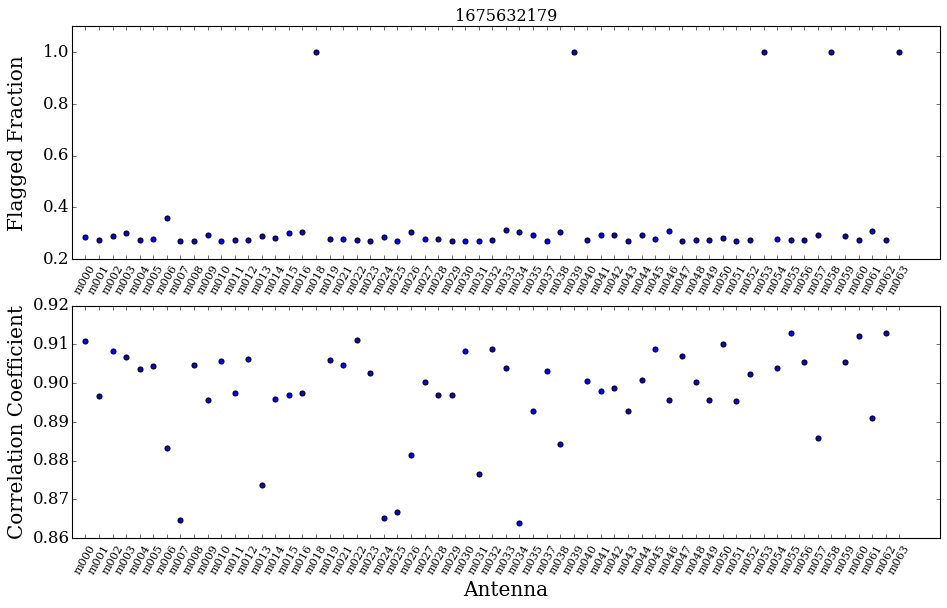

flag_info ['SARAO', 'Noise Diode', 'Known RFI', 'Lowvalue', '1st AOflagger', '2nd AOflagger', 'Elevation', 'Outlier Antennas', 'Noise Diode Value']
Usable Antennas SARAO 61
Usable Antennas before AOflagger 61
Usable Antennas after AOflagger 61
Usable Antennas after Antenna flagger 59
Usable Antennas Final 56
Flagged Fraction Median 0.278
Correlation Coefficient Median 0.900


<Figure size 640x480 with 0 Axes>

In [4]:
flag_fraction = [
    np.sum(calibrated_vis.mask[:, :, i_ant] > 0)
    / (calibrated_vis.shape[0] * calibrated_vis.shape[1])
    for i_ant, ant in enumerate(antennas)
]

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=False, figsize=(14, 8))

ax1.scatter(np.arange(len(antenna_list)), flag_fraction)
ax2.scatter(np.arange(len(antenna_list)), r_vis_synch_ant)

ax1.set_ylabel("Flagged Fraction", fontsize=18)
ax2.set_ylabel("Correlation Coefficient", fontsize=18)
ax2.set_xlabel("Antenna", fontsize=18)
ax1.set_xlim(-1, 63)
ax2.set_xlim(-1, 63)
ax1.set_xticks(np.arange(len(antenna_list)))
ax1.set_xticklabels(antenna_list, rotation=60, ha="center", fontsize=10)
ax2.set_xticks(np.arange(len(antenna_list)))
ax2.set_xticklabels(antenna_list, rotation=60, ha="center", fontsize=10)
ax1.set_title(block_name)
fig.align_ylabels()
# plt.savefig(figure_path+block_name+'_flagfraction_correlation.png',dpi=200)
plt.show()
plt.clf()

print(
    "flag_info",
    [
        "SARAO",
        "Noise Diode",
        "Known RFI",
        "Lowvalue",
        "1st AOflagger",
        "2nd AOflagger",
        "Elevation",
        "Outlier Antennas",
        "Noise Diode Value",
    ],
)
print("Usable Antennas SARAO", np.sum(Usable_antennas_SARAO))
print("Usable Antennas before AOflagger", np.sum(Usable_antennas_beforeaoflagger))
print("Usable Antennas after AOflagger", np.sum(Usable_antennas_afteraoflagger))
print(
    "Usable Antennas after Antenna flagger", np.sum(Usable_antennas_afterantennaflagger)
)
print("Usable Antennas Final", np.sum(Usable_antennas_final))
print("Flagged Fraction Median", f"{np.median(flag_fraction):.3f}")
print("Correlation Coefficient Median", f"{np.nanmedian(r_vis_synch_ant):.3f}")

## Visibility Spectra

Examine the spectra of the raw visibilities before applying AOFlagger, and compare them with the data after flagging. 
This allows us to assess the data quality and determine how much data has been flagged by SARAO or AOFlagger.

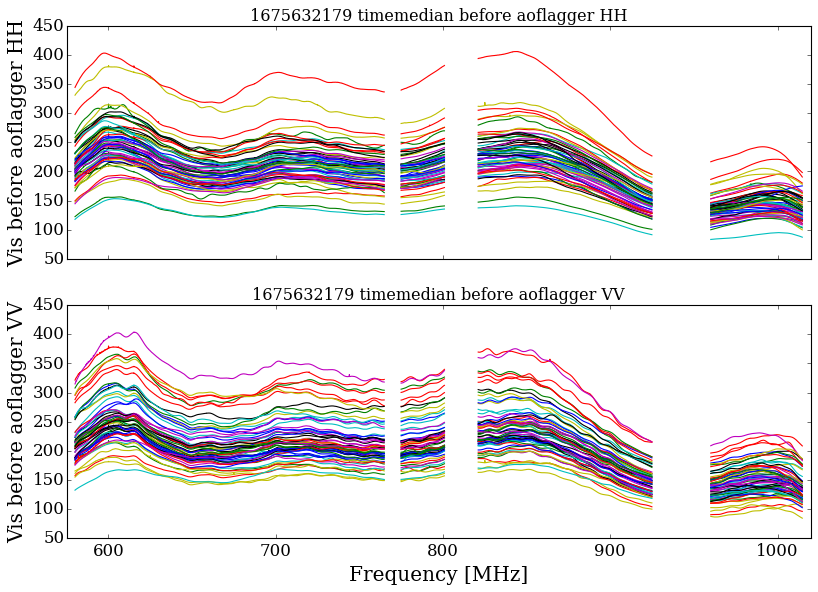

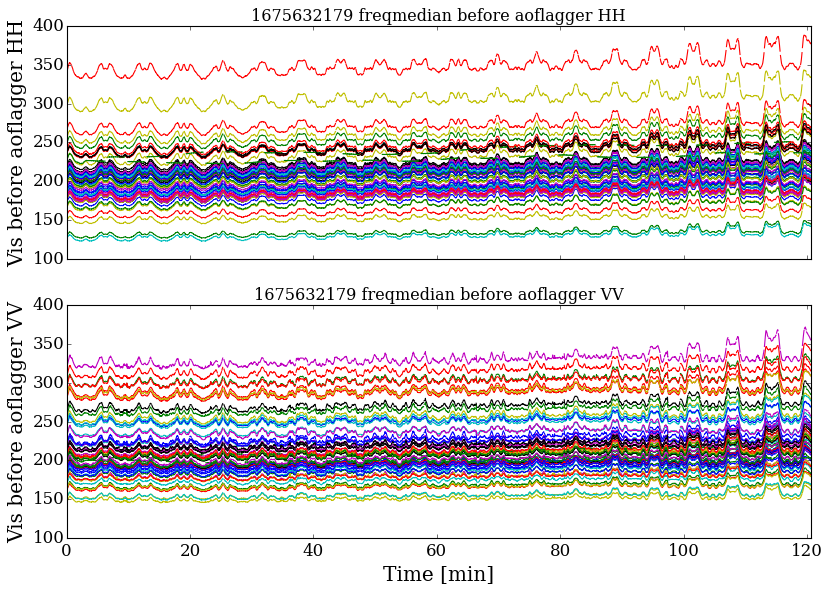

In [5]:
visibility = np.ma.masked_array(visibility.data, mask=flags_before_aoflagger)
vis_before_aoflagger_timemedian = np.ma.median(visibility, axis=0)
vis_before_aoflagger_freqmedian = np.ma.median(visibility, axis=1)
visibility = np.ma.masked_array(visibility.data, mask=flags_combine)
del flags_before_aoflagger, flags_combine
gc.collect()

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 8))

for i_receiver, receiver in enumerate(receiver_list):
    if "h" in str(receiver_list[i_receiver]):
        ax1.plot(freq, vis_before_aoflagger_timemedian[:, i_receiver])
    elif "v" in str(receiver_list[i_receiver]):
        ax2.plot(freq, vis_before_aoflagger_timemedian[:, i_receiver])


ax1.set_ylabel("Vis before aoflagger HH", fontsize=18)
ax2.set_ylabel("Vis before aoflagger VV", fontsize=18)
ax2.set_xlabel("Frequency [MHz]", fontsize=18)
ax2.set_xlim(freq.min() - 5, freq.max() + 5)
ax1.set_title(block_name + " timemedian before aoflagger HH")
ax2.set_title(block_name + " timemedian before aoflagger VV")
fig.align_ylabels()
# plt.savefig(figure_path+block_name+'_time_median_before_aoflagger.png',dpi=200)
# plt.clf()
plt.show()
plt.close()

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 8))

for i_receiver, receiver in enumerate(receiver_list):
    if "h" in str(receiver_list[i_receiver]):
        ax1.plot(
            (timestamps - timestamps.min()) / 60,
            vis_before_aoflagger_freqmedian[:, i_receiver],
        )
    elif "v" in str(receiver_list[i_receiver]):
        ax2.plot(
            (timestamps - timestamps.min()) / 60,
            vis_before_aoflagger_freqmedian[:, i_receiver],
        )


ax1.set_ylabel("Vis before aoflagger HH", fontsize=18)
ax2.set_ylabel("Vis before aoflagger VV", fontsize=18)
ax2.set_xlabel("Time [min]", fontsize=18)
ax2.set_xlim(0, (timestamps.max() - timestamps.min()) / 60)
ax1.set_title(block_name + " freqmedian before aoflagger HH")
ax2.set_title(block_name + " freqmedian before aoflagger VV")
fig.align_ylabels()
# plt.savefig(figure_path+block_name+'_freq_median_before_aoflagger.png',dpi=200)
# plt.clf()
plt.show()
plt.close()

## Calibrated Data Waterfall

Examine the waterfall plot of the calibrated data (left) and the raw visibilities for 
HH and VV polarizations (center and right) to assess data quality.  If the R_corr is nan, 
it means the antenna is masked before correlation flagging.

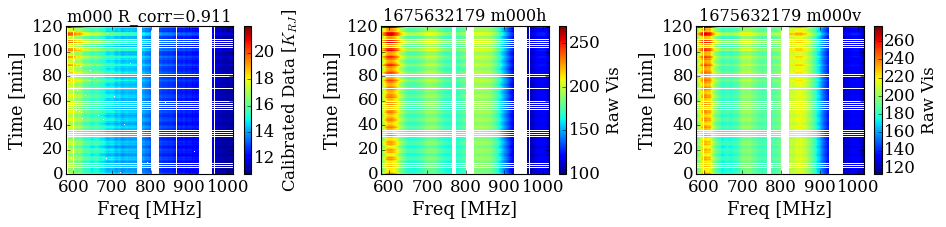

<Figure size 640x480 with 0 Axes>

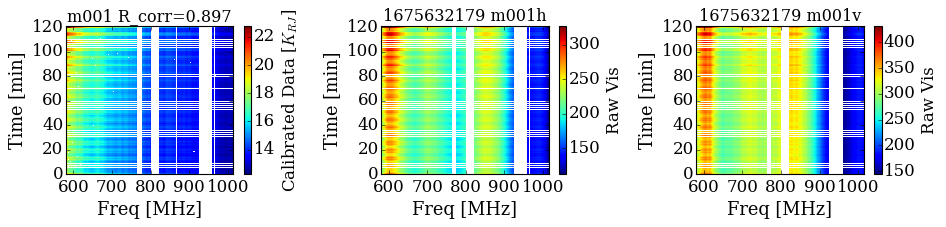

<Figure size 640x480 with 0 Axes>

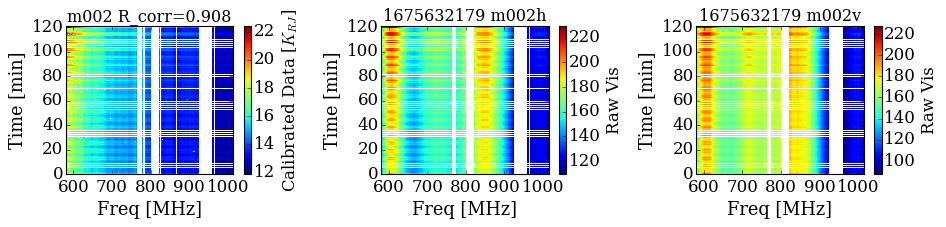

<Figure size 640x480 with 0 Axes>

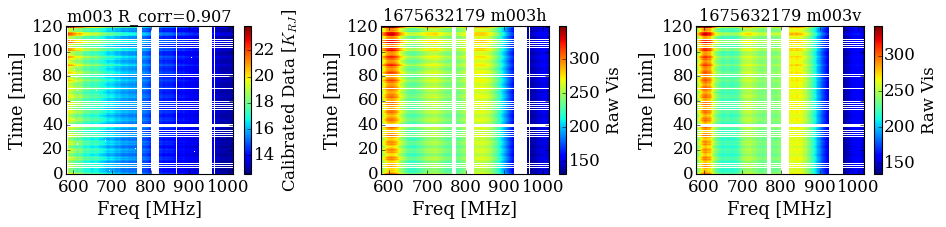

<Figure size 640x480 with 0 Axes>

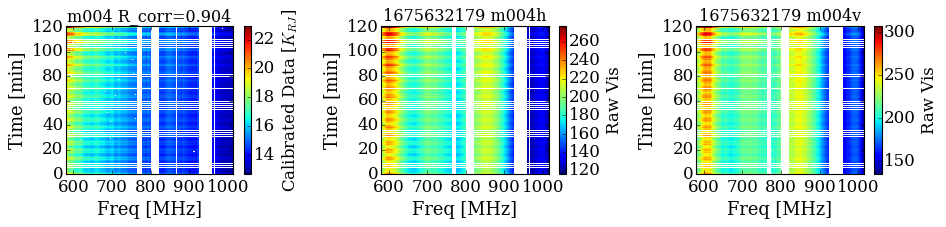

<Figure size 640x480 with 0 Axes>

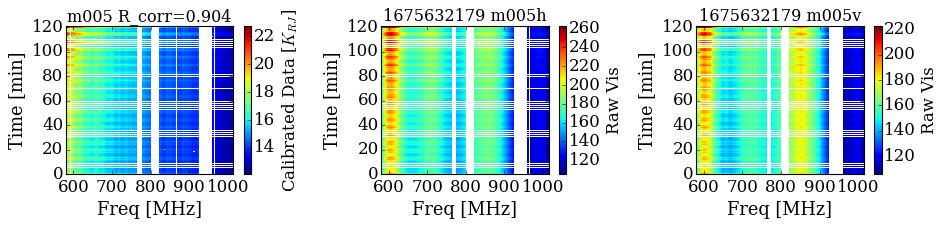

<Figure size 640x480 with 0 Axes>

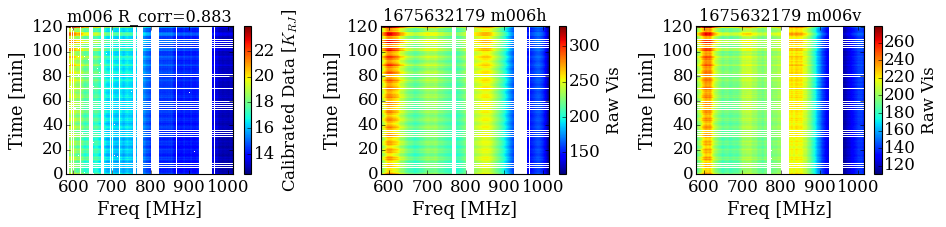

<Figure size 640x480 with 0 Axes>

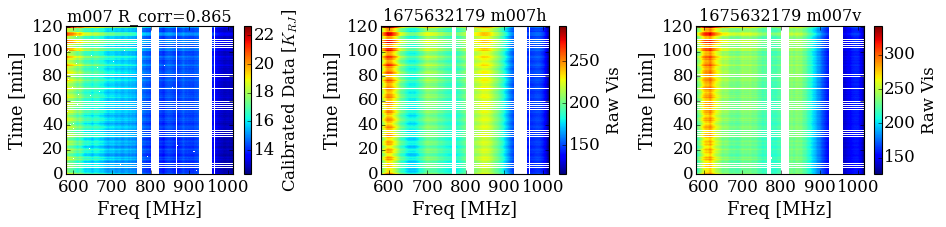

<Figure size 640x480 with 0 Axes>

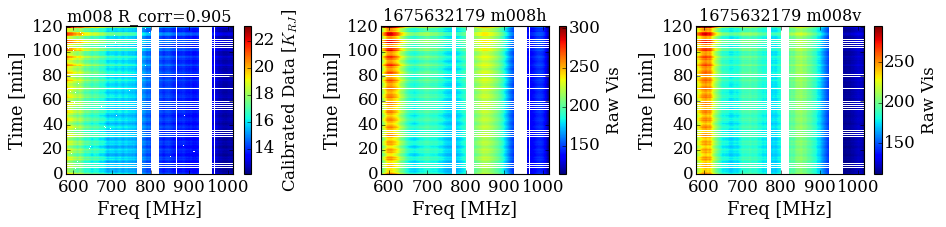

<Figure size 640x480 with 0 Axes>

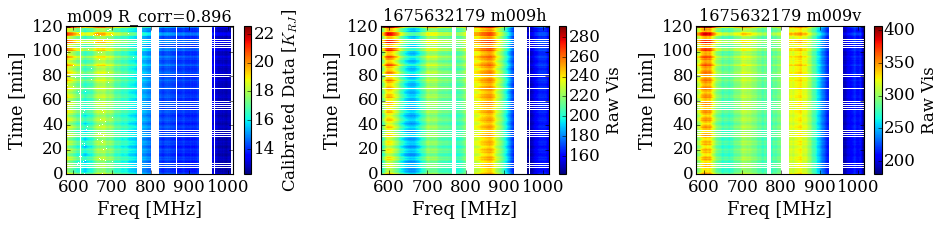

<Figure size 640x480 with 0 Axes>

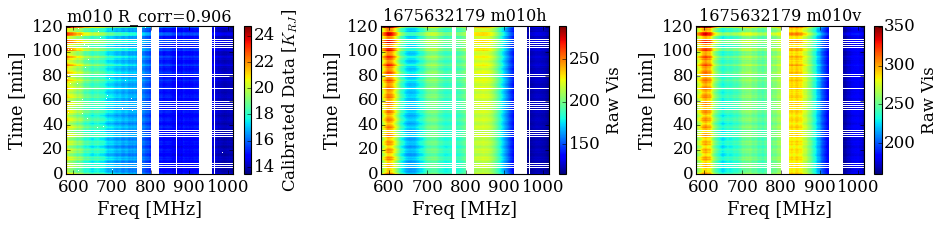

<Figure size 640x480 with 0 Axes>

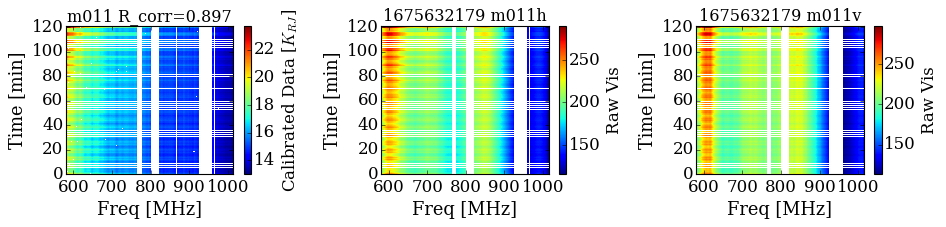

<Figure size 640x480 with 0 Axes>

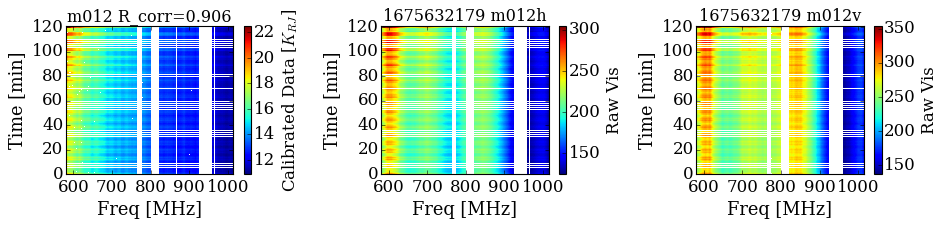

<Figure size 640x480 with 0 Axes>

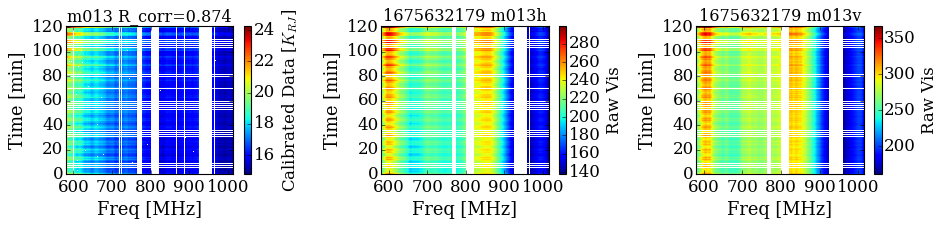

<Figure size 640x480 with 0 Axes>

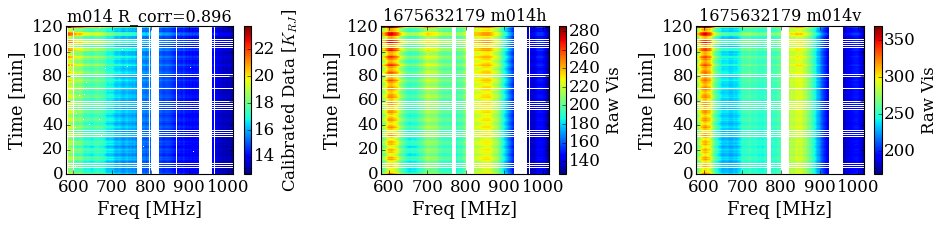

<Figure size 640x480 with 0 Axes>

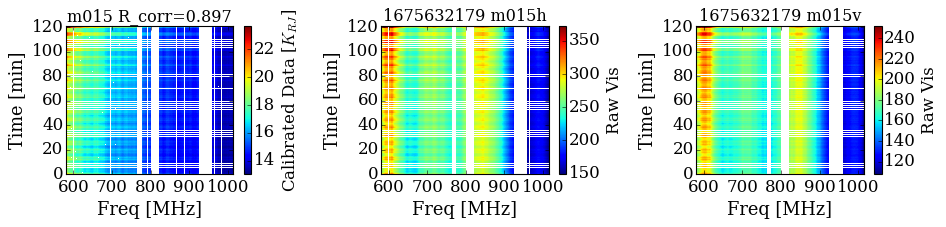

<Figure size 640x480 with 0 Axes>

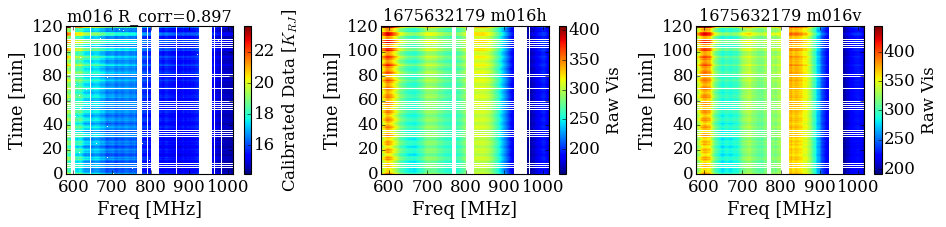

<Figure size 640x480 with 0 Axes>

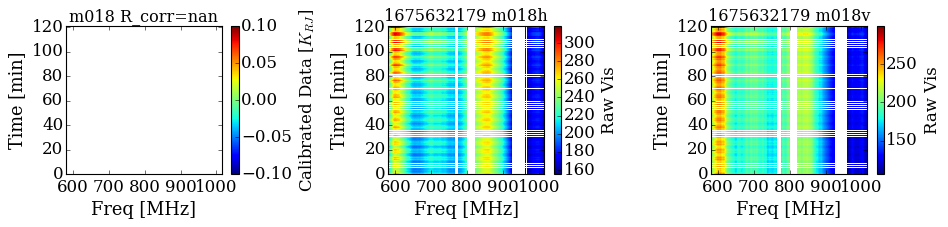

<Figure size 640x480 with 0 Axes>

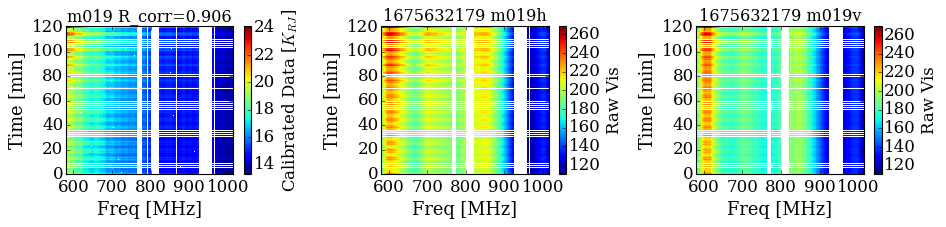

<Figure size 640x480 with 0 Axes>

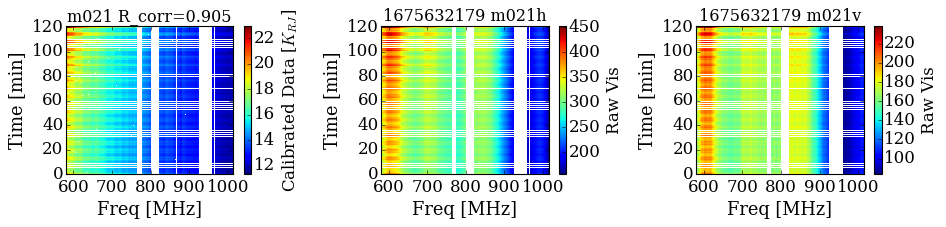

<Figure size 640x480 with 0 Axes>

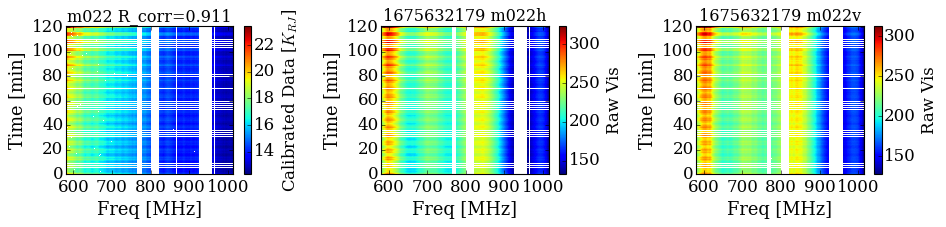

<Figure size 640x480 with 0 Axes>

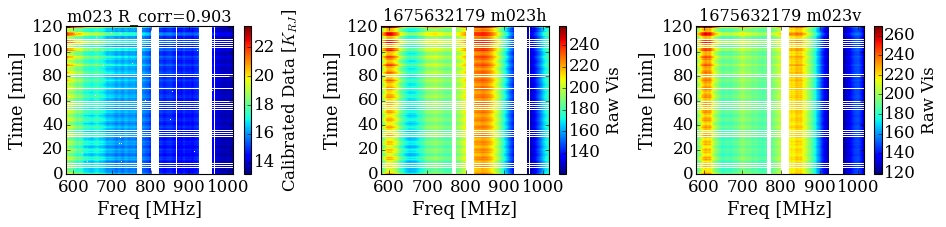

<Figure size 640x480 with 0 Axes>

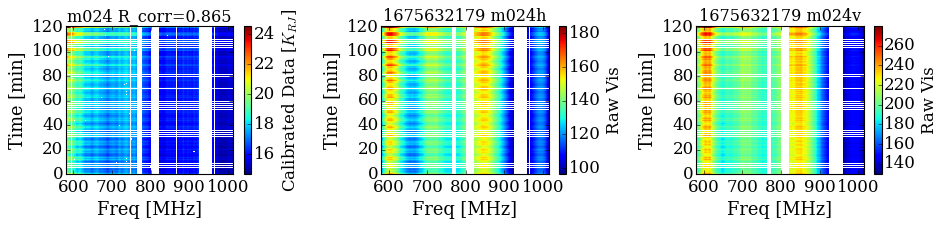

<Figure size 640x480 with 0 Axes>

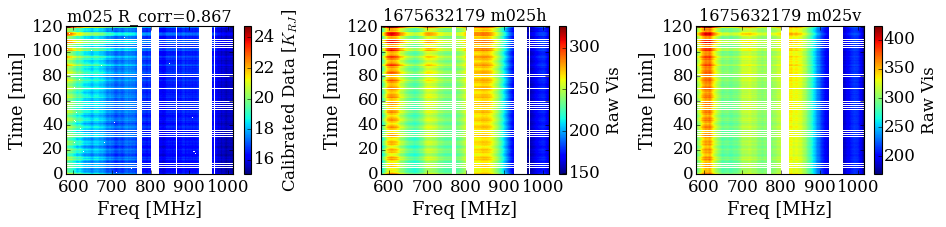

<Figure size 640x480 with 0 Axes>

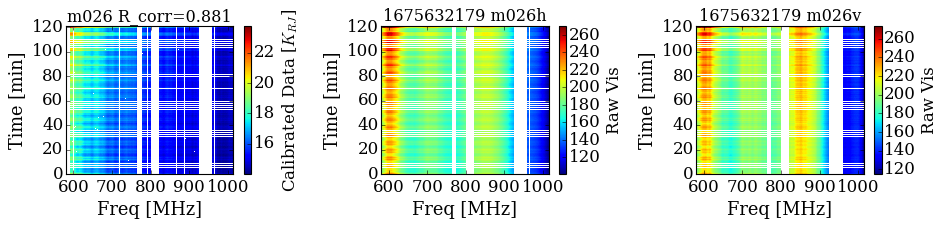

<Figure size 640x480 with 0 Axes>

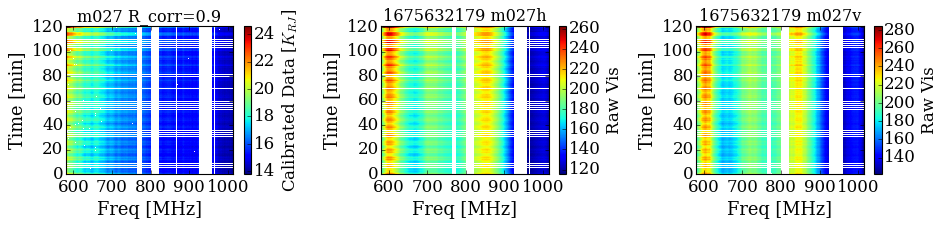

<Figure size 640x480 with 0 Axes>

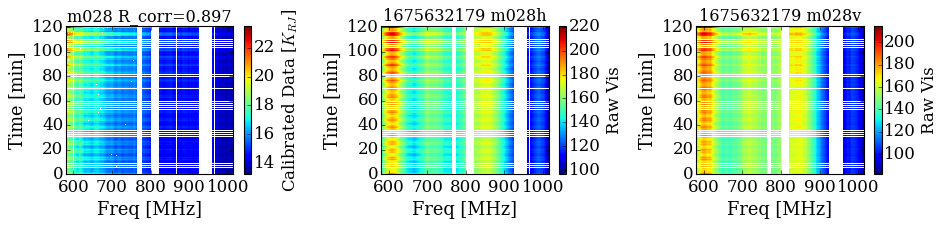

<Figure size 640x480 with 0 Axes>

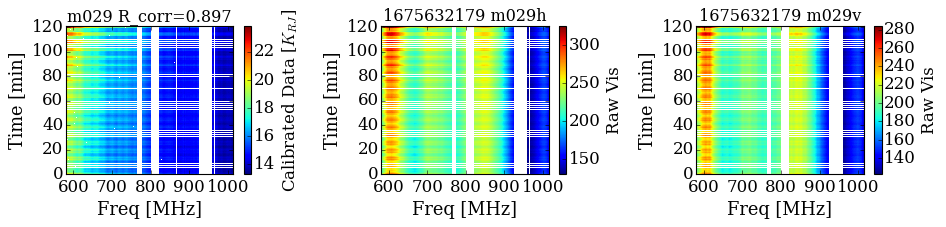

<Figure size 640x480 with 0 Axes>

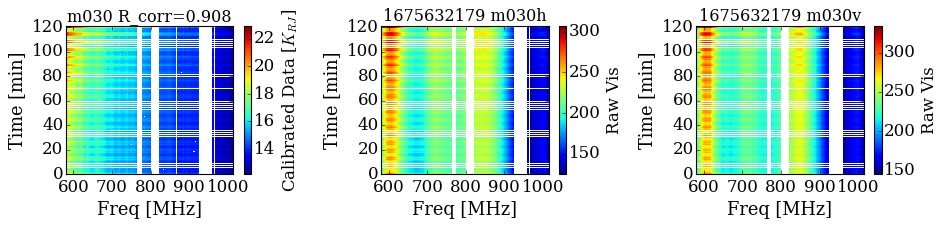

<Figure size 640x480 with 0 Axes>

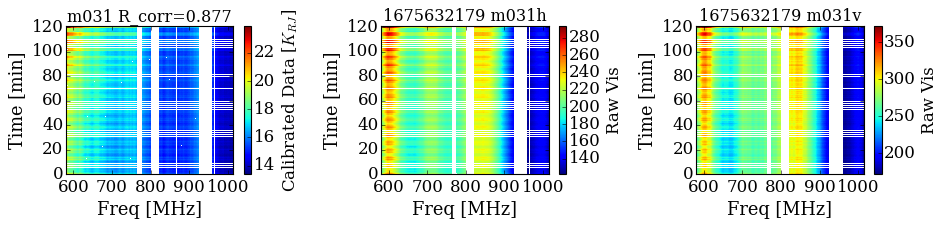

<Figure size 640x480 with 0 Axes>

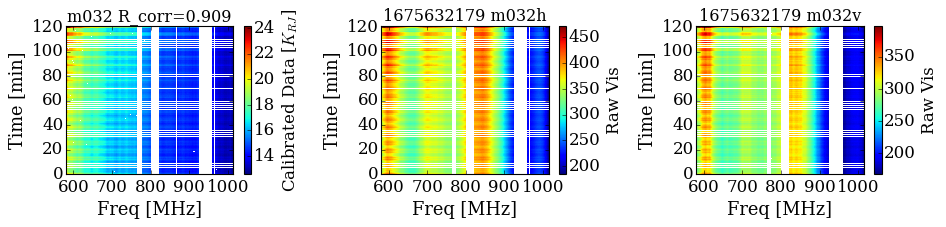

<Figure size 640x480 with 0 Axes>

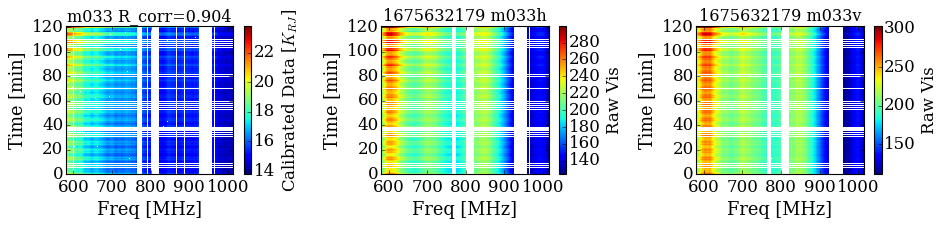

<Figure size 640x480 with 0 Axes>

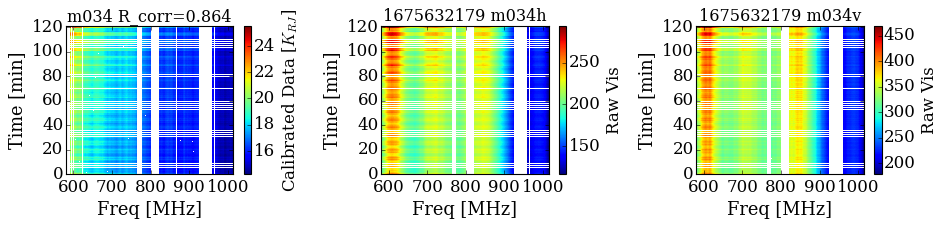

<Figure size 640x480 with 0 Axes>

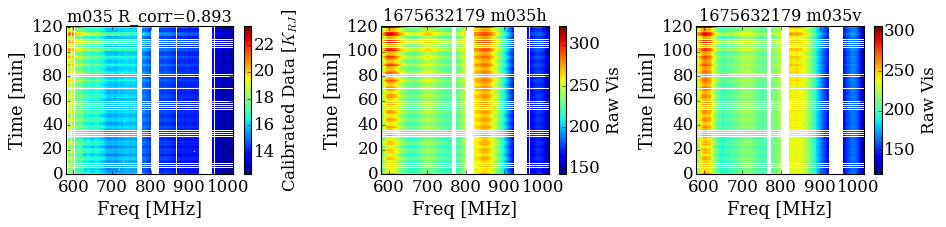

<Figure size 640x480 with 0 Axes>

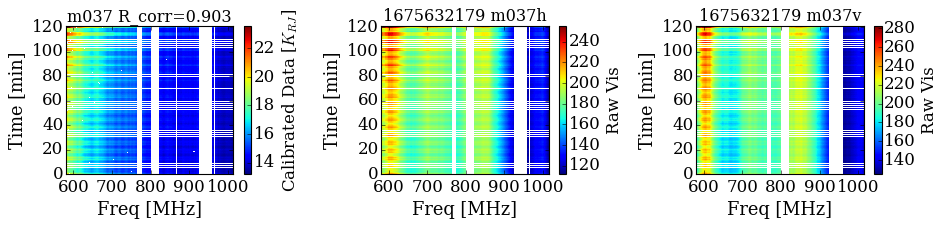

<Figure size 640x480 with 0 Axes>

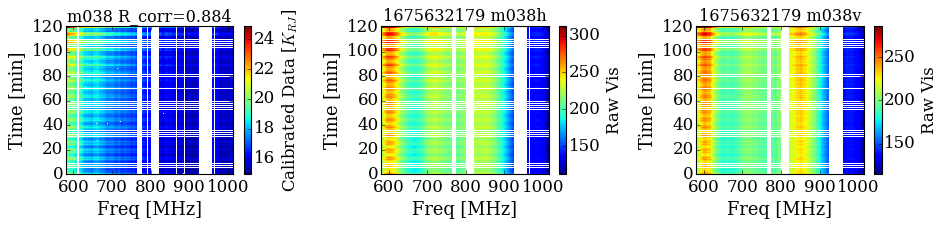

<Figure size 640x480 with 0 Axes>

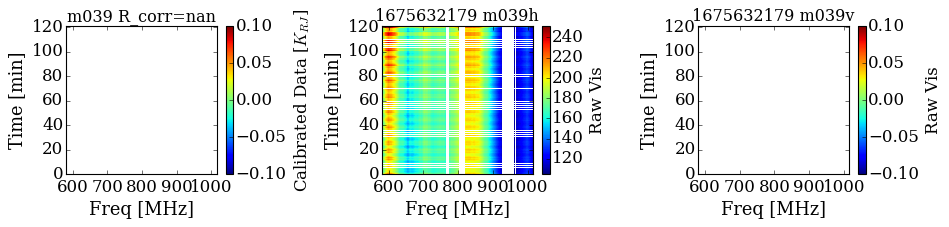

<Figure size 640x480 with 0 Axes>

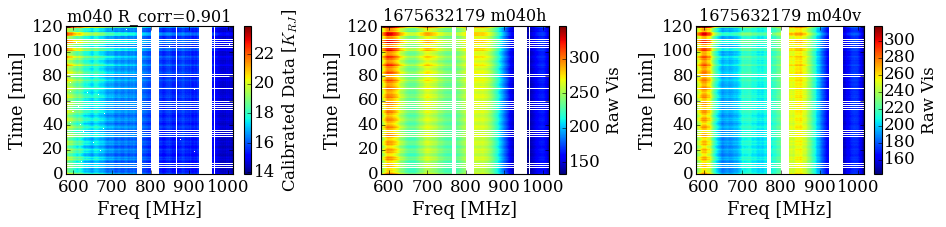

<Figure size 640x480 with 0 Axes>

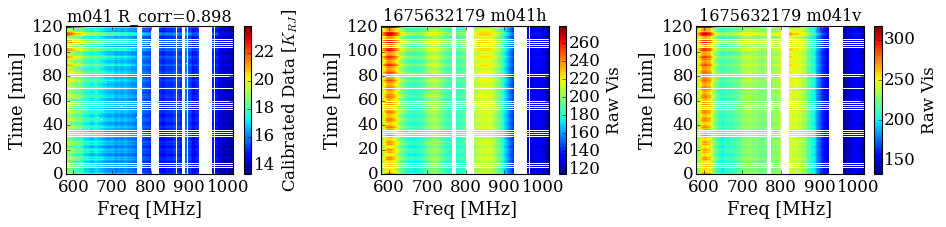

<Figure size 640x480 with 0 Axes>

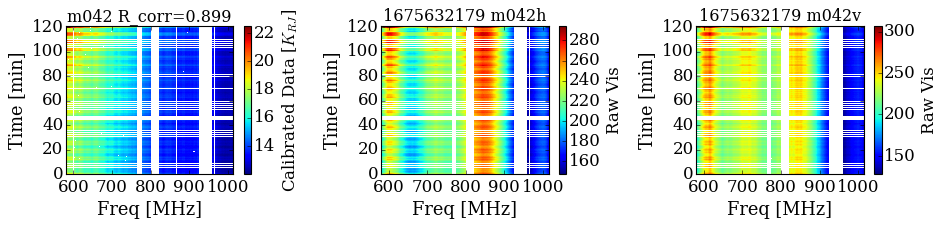

<Figure size 640x480 with 0 Axes>

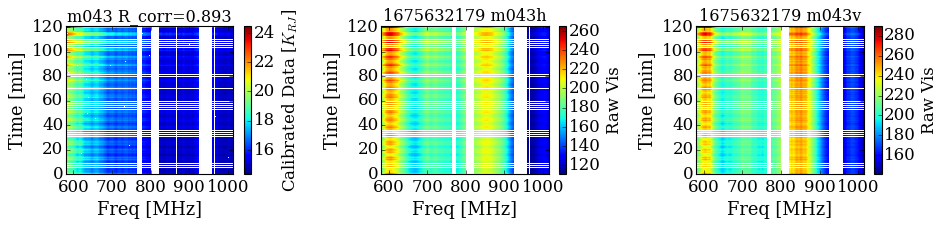

<Figure size 640x480 with 0 Axes>

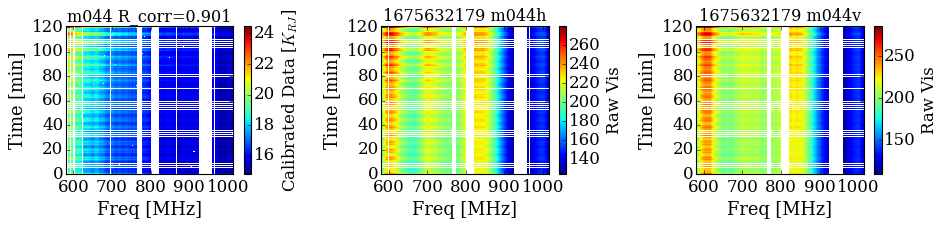

<Figure size 640x480 with 0 Axes>

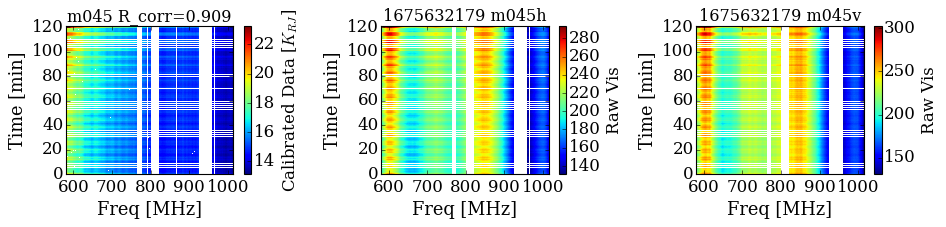

<Figure size 640x480 with 0 Axes>

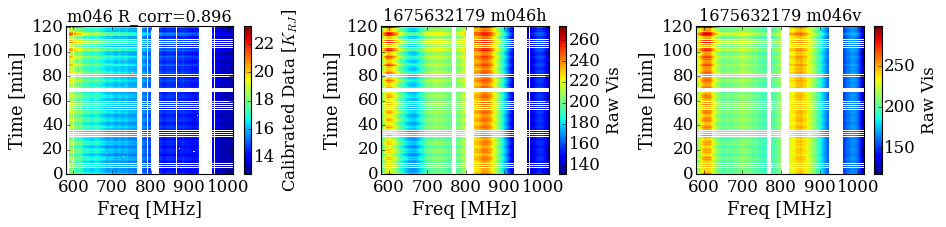

<Figure size 640x480 with 0 Axes>

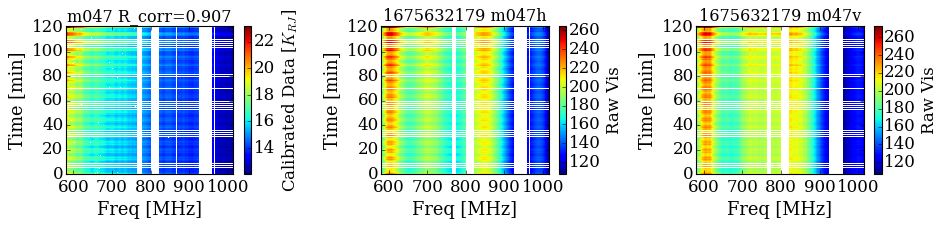

<Figure size 640x480 with 0 Axes>

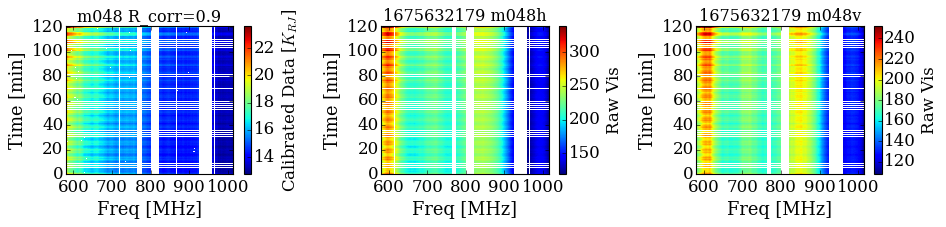

<Figure size 640x480 with 0 Axes>

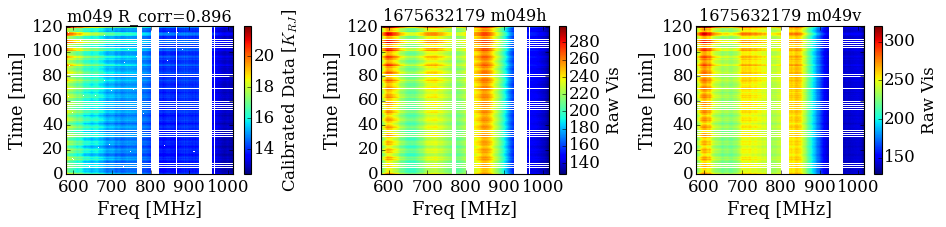

<Figure size 640x480 with 0 Axes>

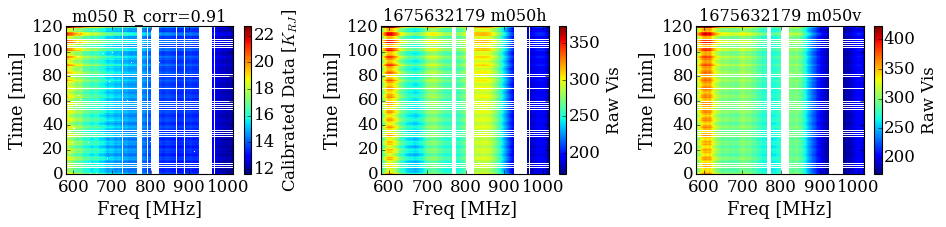

<Figure size 640x480 with 0 Axes>

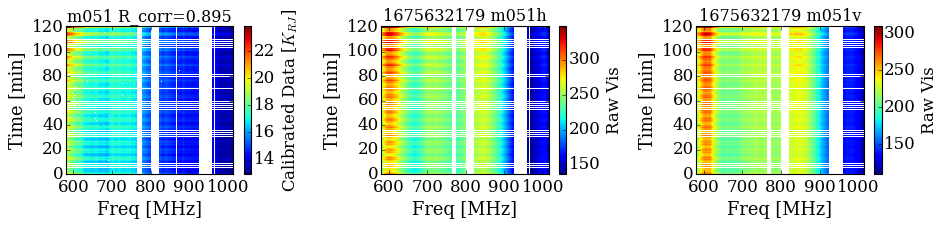

<Figure size 640x480 with 0 Axes>

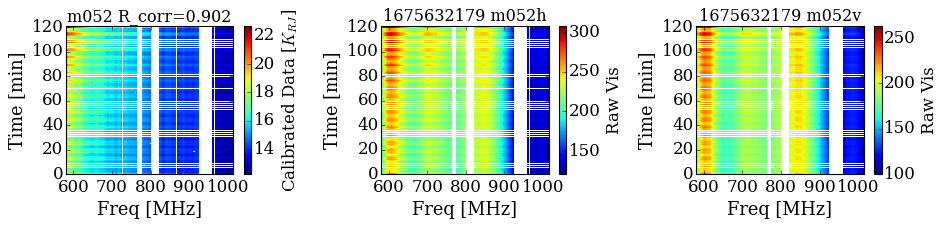

<Figure size 640x480 with 0 Axes>

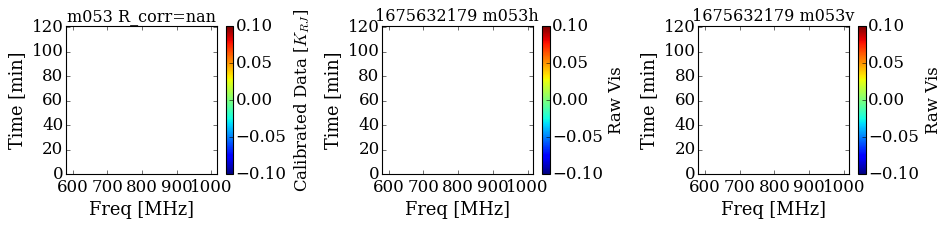

<Figure size 640x480 with 0 Axes>

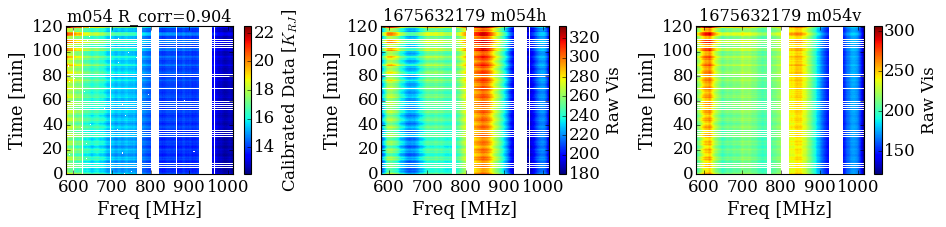

<Figure size 640x480 with 0 Axes>

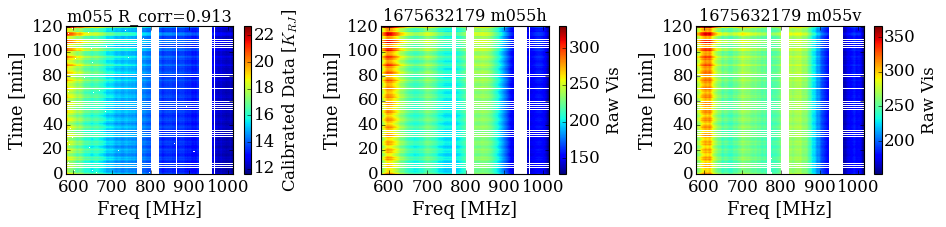

<Figure size 640x480 with 0 Axes>

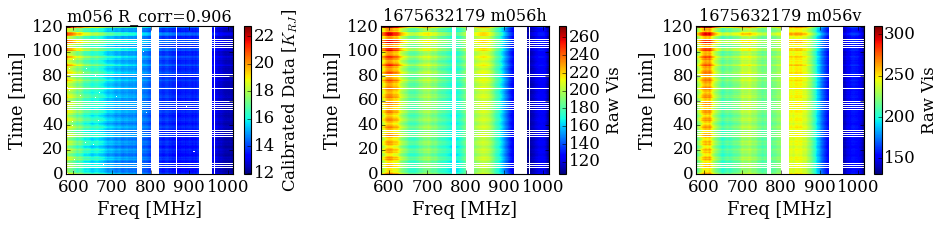

<Figure size 640x480 with 0 Axes>

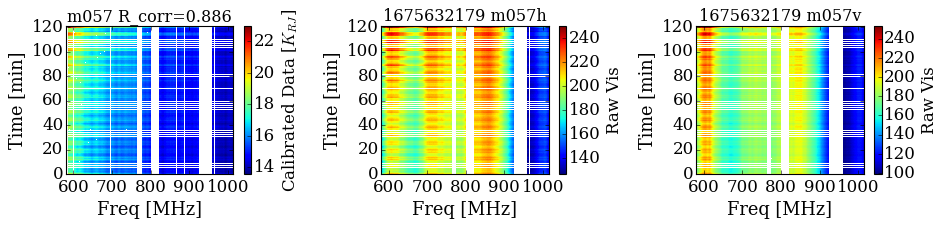

<Figure size 640x480 with 0 Axes>

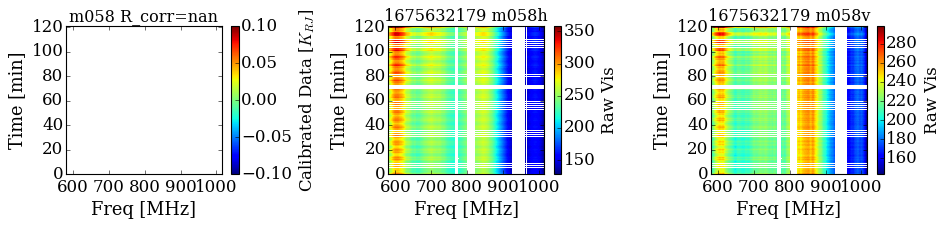

<Figure size 640x480 with 0 Axes>

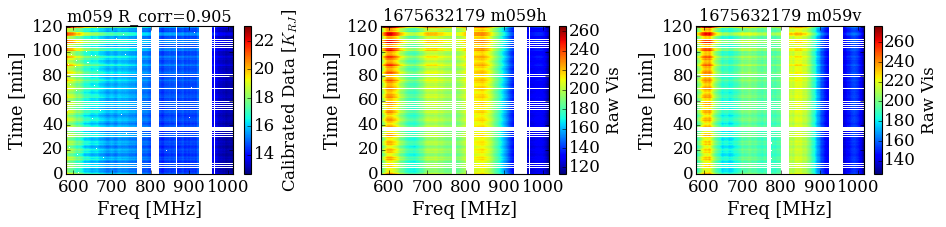

<Figure size 640x480 with 0 Axes>

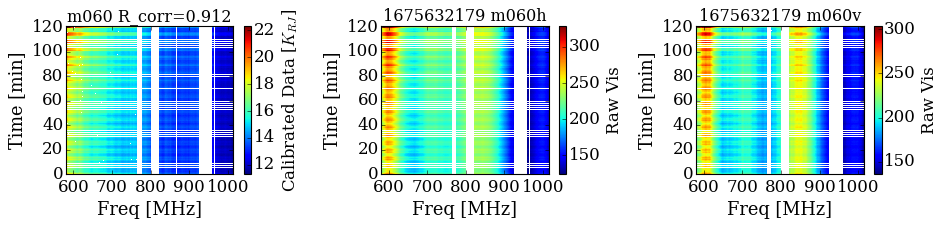

<Figure size 640x480 with 0 Axes>

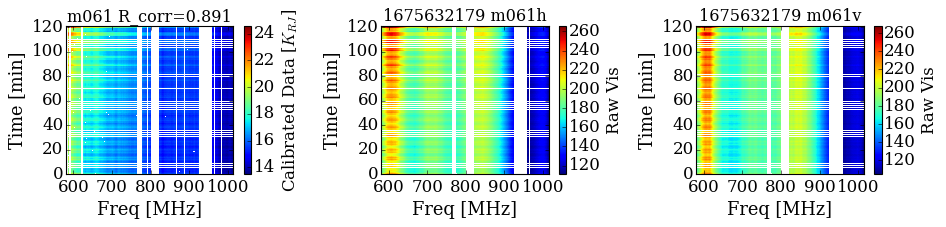

<Figure size 640x480 with 0 Axes>

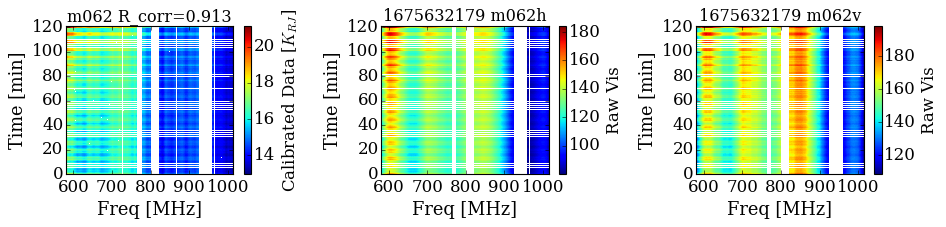

<Figure size 640x480 with 0 Axes>

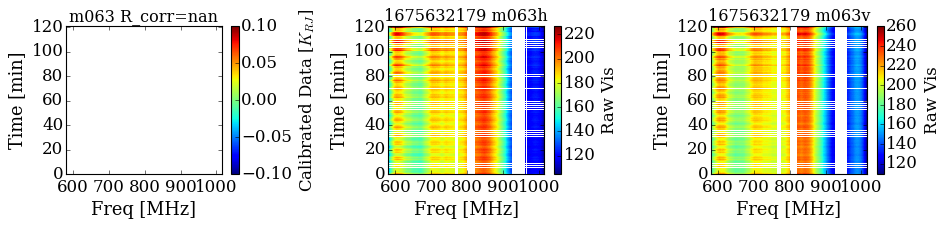

<Figure size 640x480 with 0 Axes>

In [6]:
for i_antenna, ant in enumerate(antennas):
    fig = plt.figure(figsize=(12, 3))
    ax = fig.add_subplot(1, 3, 1)
    ax2 = fig.add_subplot(1, 3, 2)
    ax3 = fig.add_subplot(1, 3, 3)

    map1 = ax.pcolormesh(
        freq, (timestamps - timestamps.min()) / 60, calibrated_vis[:, :, i_antenna]
    )

    i_receiver_list = [
        i for i, receiver in enumerate(receivers) if receiver.antenna_name == ant.name
    ]
    for i_receiver in i_receiver_list:
        if "h" in str(receiver_list[i_receiver]):
            map2 = ax2.pcolormesh(
                freq, (timestamps - timestamps.min()) / 60, visibility[:, :, i_receiver]
            )
            ax2.set_title(block_name + " " + str(receiver_list[i_receiver]))
        elif "v" in str(receiver_list[i_receiver]):
            map3 = ax3.pcolormesh(
                freq, (timestamps - timestamps.min()) / 60, visibility[:, :, i_receiver]
            )
            ax3.set_title(block_name + " " + str(receiver_list[i_receiver]))

    ax.set_xlabel("Freq [MHz]", fontsize=16)
    ax.set_ylabel("Time [min]", fontsize=16)
    ax.set_xlim(freq.min(), freq.max())
    ax.set_ylim(0, (timestamps.max() - timestamps.min()) / 60)
    ax.set_title(str(ant.name) + " R_corr=" + str(round(r_vis_synch_ant[i_antenna], 3)))
    cbar_data = plt.colorbar(map1)
    cbar_data.set_label(r"Calibrated Data [$K_{RJ}$]", fontsize=15)

    ax2.set_xlabel("Freq [MHz]", fontsize=16)
    ax2.set_ylabel("Time [min]", fontsize=16)
    ax2.set_xlim(freq.min(), freq.max())
    ax2.set_ylim(0, (timestamps.max() - timestamps.min()) / 60)
    cbar_data = plt.colorbar(map2)
    cbar_data.set_label("Raw Vis", fontsize=15)

    ax3.set_xlabel("Freq [MHz]", fontsize=16)
    ax3.set_ylabel("Time [min]", fontsize=16)
    ax3.set_xlim(freq.min(), freq.max())
    ax3.set_ylim(0, (timestamps.max() - timestamps.min()) / 60)
    cbar_data = plt.colorbar(map3)
    cbar_data.set_label("Raw Vis", fontsize=15)

    plt.tight_layout()
    # plt.savefig(figure_path+block_name+'_'+str(ant.name)+'_waterfall.png',dpi=200)
    plt.show()
    plt.clf()

## Frequency-median Data

### Raw Data

Examine the frequency median of raw data (with frequency average removed) 
from several randomly selected antennas to assess consistency across antennas.

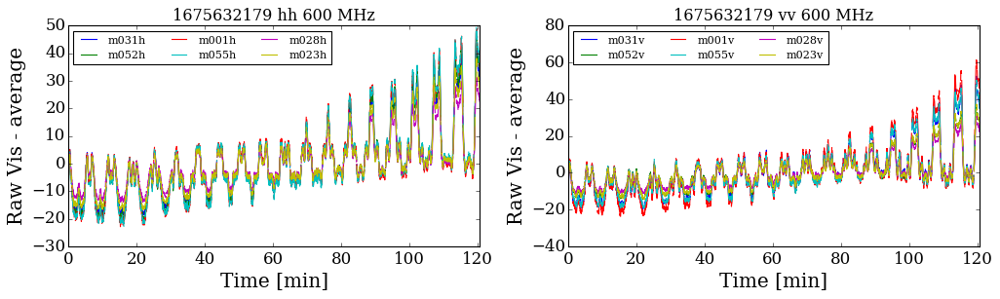

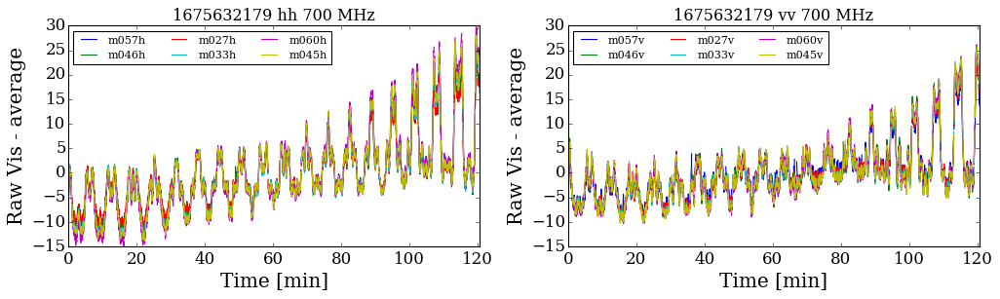

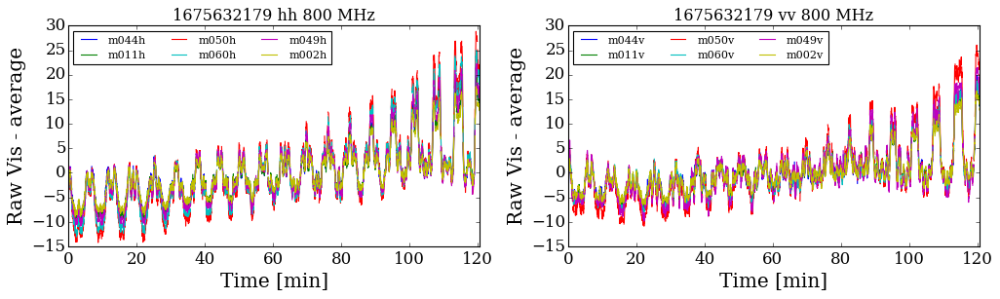

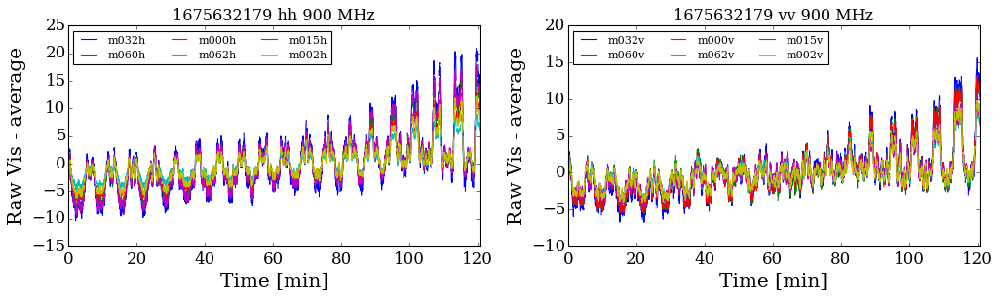

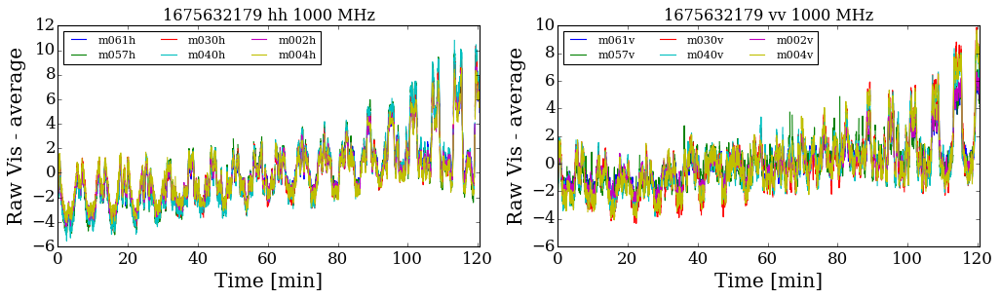

In [7]:
freq_plot_list = np.arange(600, 1020, 100)

for freq_plot in freq_plot_list:
    index_freq_plot = np.argmin(np.abs(freq - freq_plot))
    fig = plt.figure(figsize=(13, 4))

    ax = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)

    #########  randomly select 6 antennas to show, since too many antennas makes the plot unclear   ###########
    selected_antennas = random.sample(antennas, 6)
    i_receiver_list = []
    for ant in selected_antennas:
        i_receiver_list.extend(
            [
                i
                for i, receiver in enumerate(receivers)
                if receiver.antenna_name == ant.name
            ]
        )
    ###########################################################################################################

    for i_receiver in i_receiver_list:
        visibility_plot = visibility[:, index_freq_plot, i_receiver] - np.ma.mean(
            visibility[:, index_freq_plot, i_receiver]
        )

        if "h" in str(receiver_list[i_receiver]):
            ax.plot(
                (timestamps - timestamps.min()) / 60,
                visibility_plot,
                label=receiver_list[i_receiver],
            )
        elif "v" in str(receiver_list[i_receiver]):
            ax2.plot(
                (timestamps - timestamps.min()) / 60,
                visibility_plot,
                label=receiver_list[i_receiver],
            )

    ax.set_xlabel("Time [min]", fontsize=18)
    ax.set_ylabel("Raw Vis - average", fontsize=18)
    ax.set_xlim(0, (timestamps.max() - timestamps.min()) / 60)
    ax.set_title(block_name + " hh " + str(freq_plot) + " MHz")
    ax.legend(loc="upper left", ncol=3, fontsize=10)

    ax2.set_xlabel("Time [min]", fontsize=18)
    ax2.set_ylabel("Raw Vis - average", fontsize=18)
    ax2.set_xlim(0, (timestamps.max() - timestamps.min()) / 60)
    ax2.set_title(block_name + " vv " + str(freq_plot) + " MHz")
    ax2.legend(loc="upper left", ncol=3, fontsize=10)

    plt.tight_layout()
    # plt.savefig(figure_path+block_name+'_raw_minus_average.png',dpi=200)
    # plt.clf()
    plt.show()
    plt.close()

Raw vs. Calibrated Data

Examine the frequency median of the raw and calibrated data 
for all antennas to assess data quality and evaluate the effectiveness of RFI flagging after 
calibration and following post-calibration aoflagger processing.

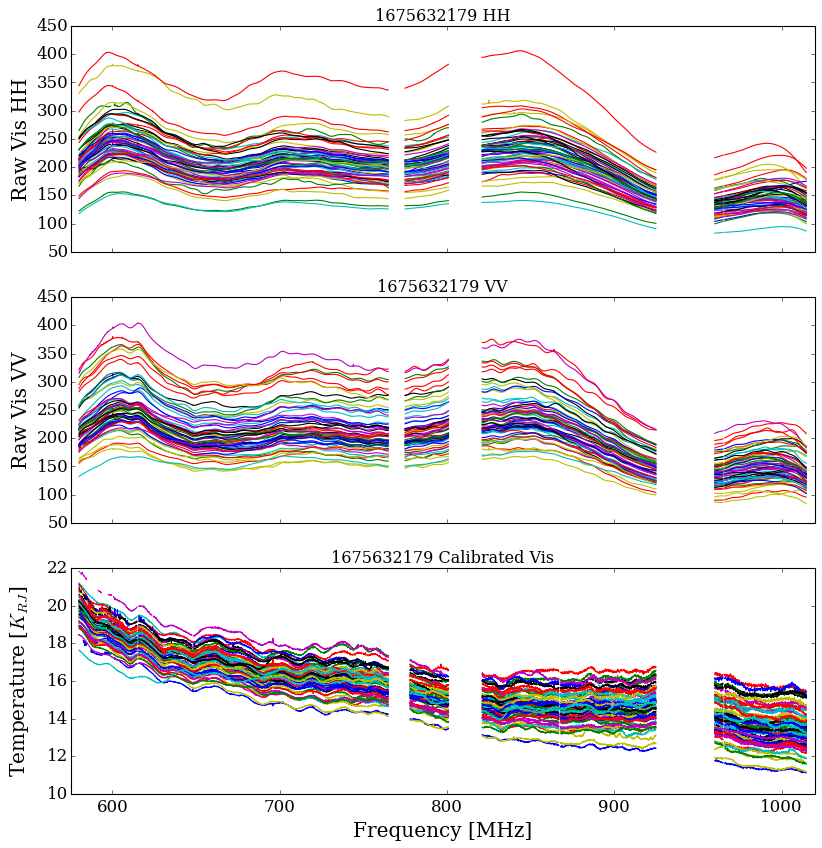

<Figure size 640x480 with 0 Axes>

In [8]:
calibrated_vis_timemedian = np.ma.median(calibrated_vis, axis=0)
visibility_timemedian = np.ma.median(visibility, axis=0)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize=(12, 12))

for i_receiver, receiver in enumerate(receiver_list):
    if "h" in str(receiver_list[i_receiver]):
        ax1.plot(freq, visibility_timemedian[:, i_receiver])
    elif "v" in str(receiver_list[i_receiver]):
        ax2.plot(freq, visibility_timemedian[:, i_receiver])

for i_antenna, antenna in enumerate(antenna_list):
    ax3.plot(freq, calibrated_vis_timemedian[:, i_antenna])

ax1.set_ylabel("Raw Vis HH", fontsize=18)
ax2.set_ylabel("Raw Vis VV", fontsize=18)
ax3.set_xlabel("Frequency [MHz]", fontsize=18)
ax3.set_xlim(freq.min() - 5, freq.max() + 5)
ax3.set_ylabel(r"Temperature [$K_{RJ}$]", fontsize=18)
# ax3.set_ylim(6, 70)
ax1.set_title(block_name + " HH")
ax2.set_title(block_name + " VV")
ax3.set_title(block_name + " Calibrated Vis")

fig.align_ylabels()
# plt.savefig(figure_path+block_name+'_time_median.png',dpi=200)
plt.show()
plt.clf()

## HH and VV Scan Track

Plot the scan tracks of raw HH and VV visibilities to assess data quality in the map view.

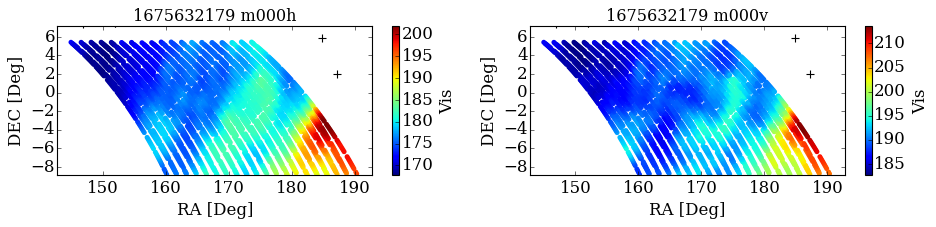

<Figure size 640x480 with 0 Axes>

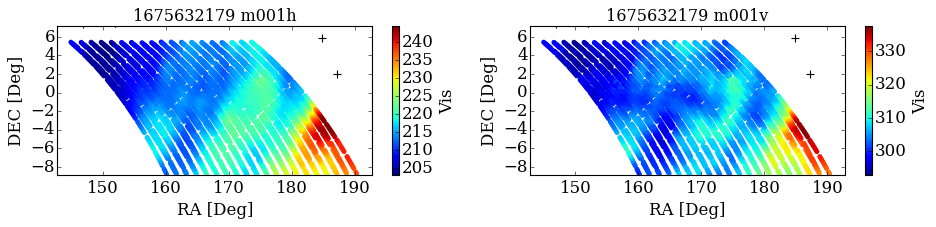

<Figure size 640x480 with 0 Axes>

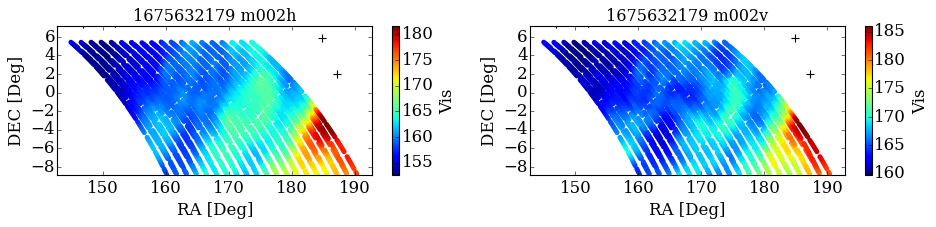

<Figure size 640x480 with 0 Axes>

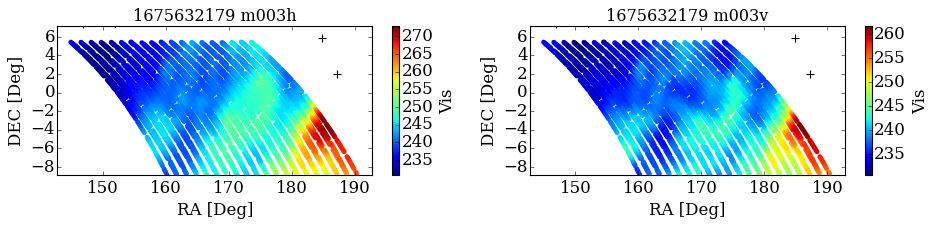

<Figure size 640x480 with 0 Axes>

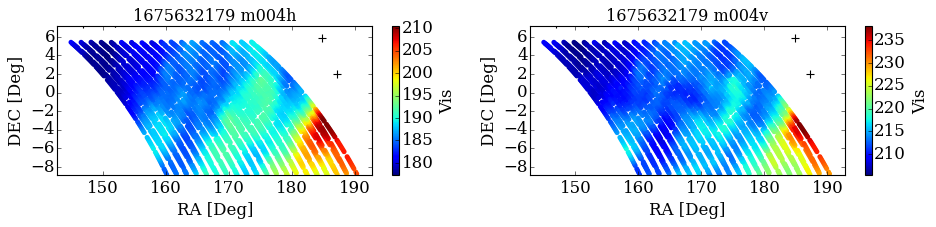

<Figure size 640x480 with 0 Axes>

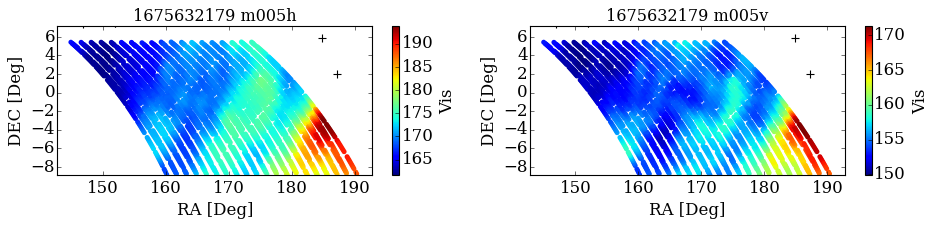

<Figure size 640x480 with 0 Axes>

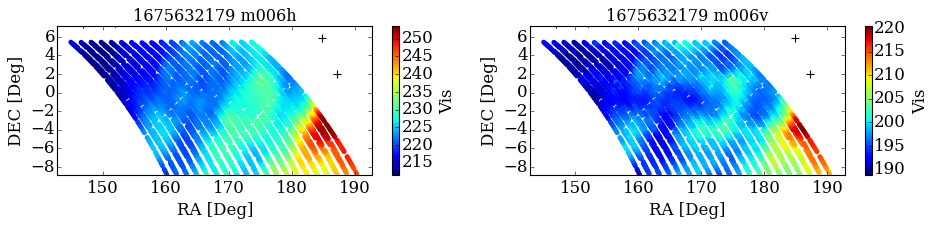

<Figure size 640x480 with 0 Axes>

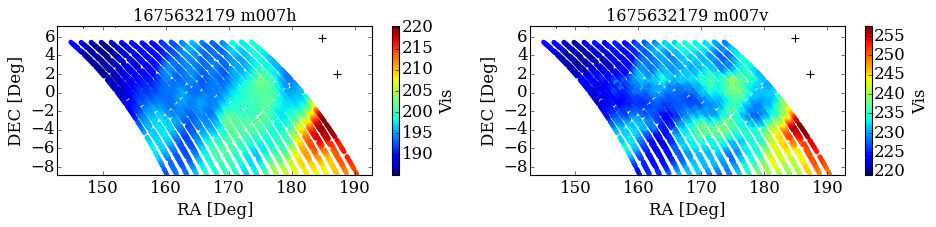

<Figure size 640x480 with 0 Axes>

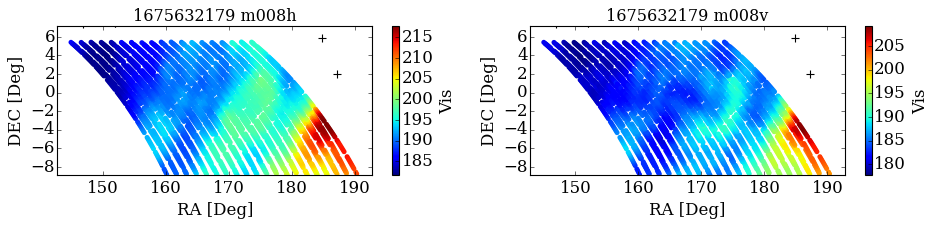

<Figure size 640x480 with 0 Axes>

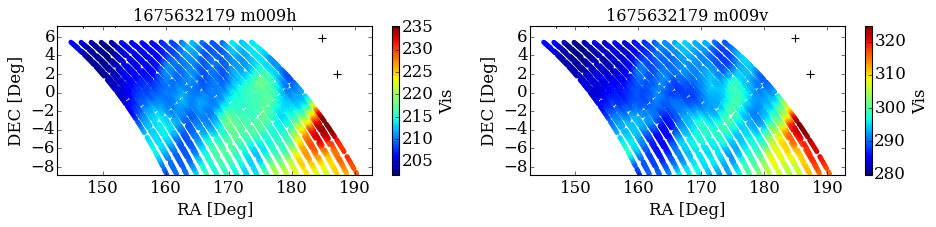

<Figure size 640x480 with 0 Axes>

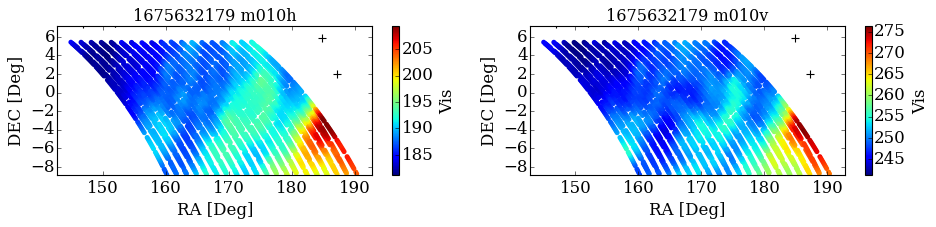

<Figure size 640x480 with 0 Axes>

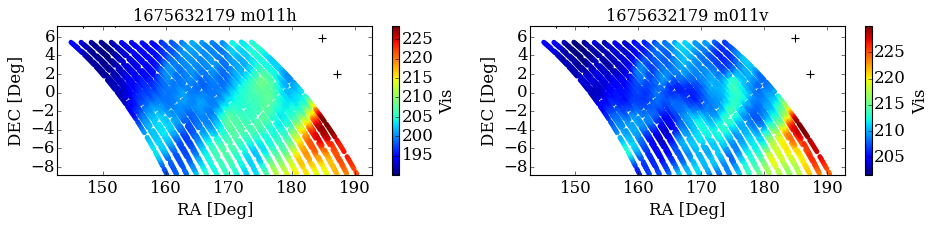

<Figure size 640x480 with 0 Axes>

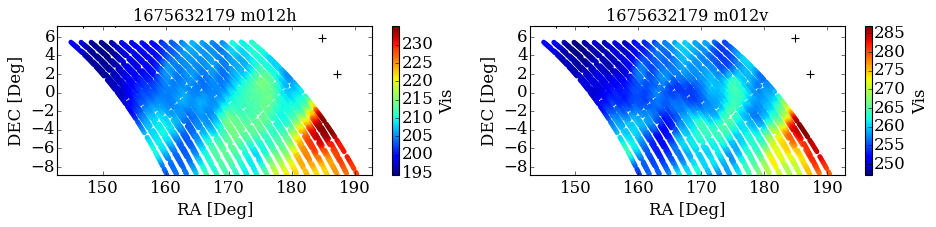

<Figure size 640x480 with 0 Axes>

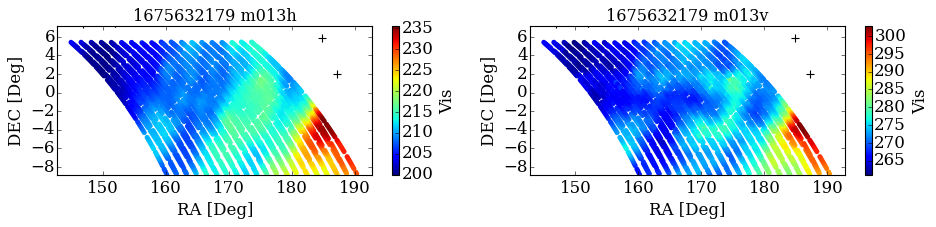

<Figure size 640x480 with 0 Axes>

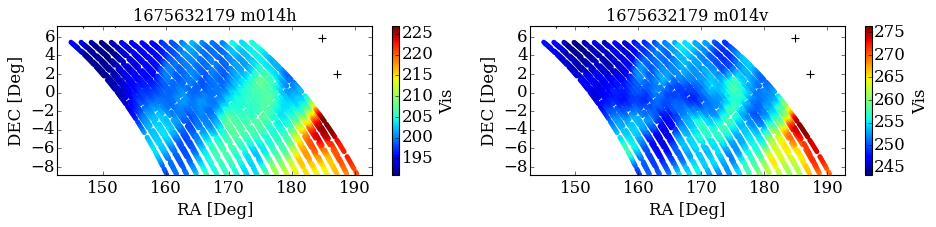

<Figure size 640x480 with 0 Axes>

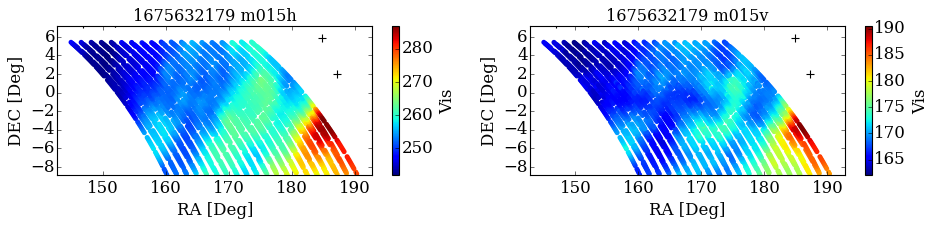

<Figure size 640x480 with 0 Axes>

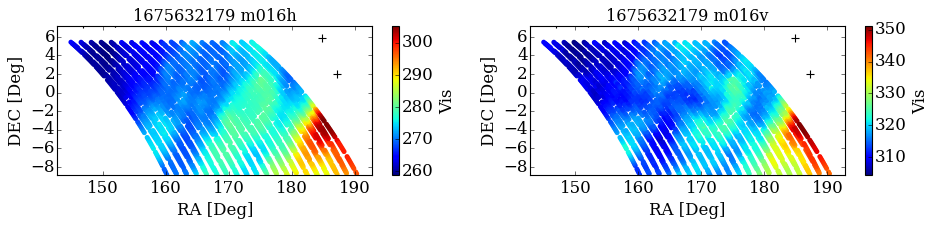

<Figure size 640x480 with 0 Axes>

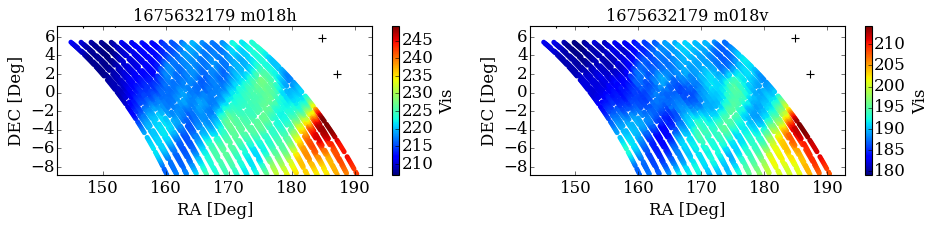

<Figure size 640x480 with 0 Axes>

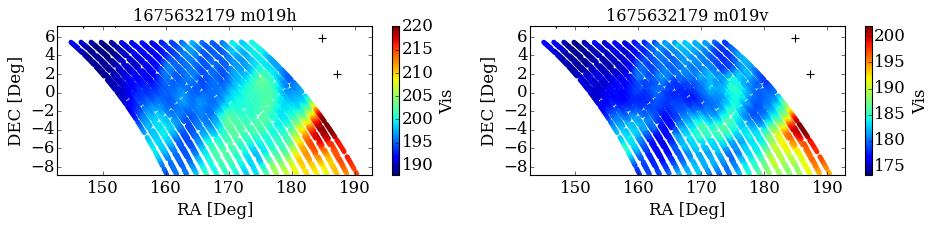

<Figure size 640x480 with 0 Axes>

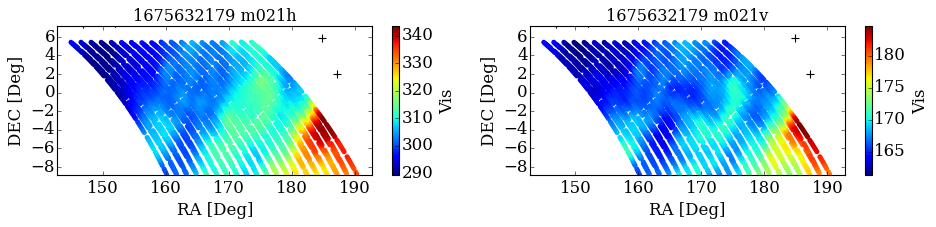

<Figure size 640x480 with 0 Axes>

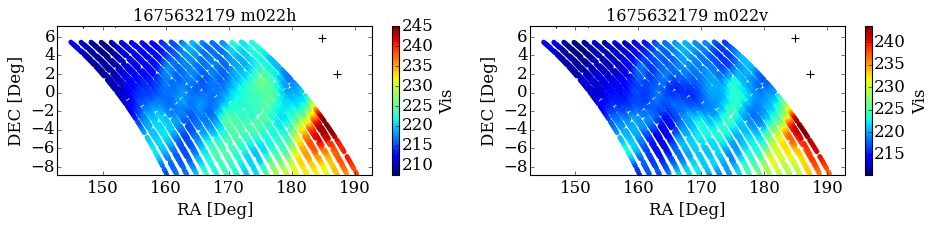

<Figure size 640x480 with 0 Axes>

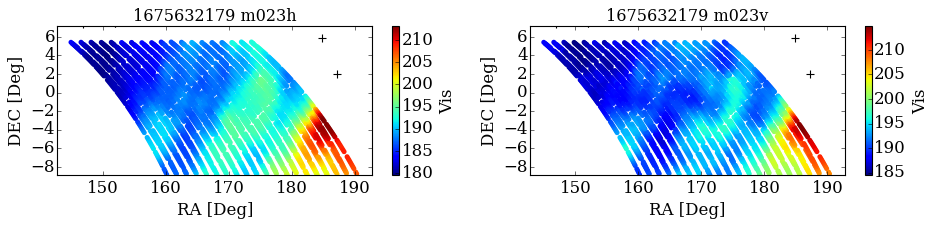

<Figure size 640x480 with 0 Axes>

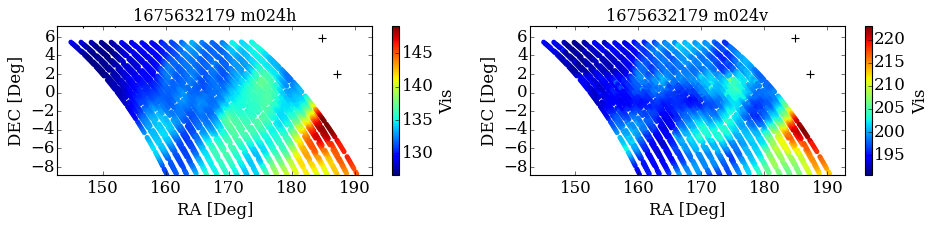

<Figure size 640x480 with 0 Axes>

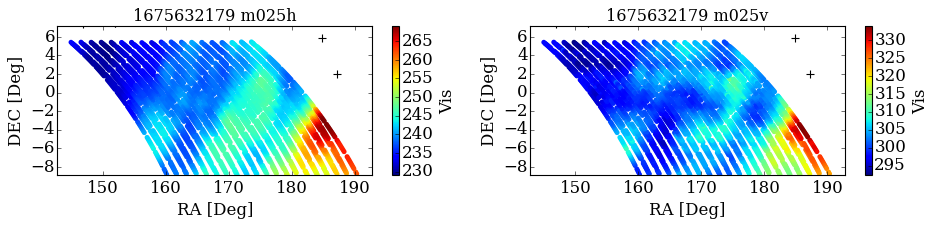

<Figure size 640x480 with 0 Axes>

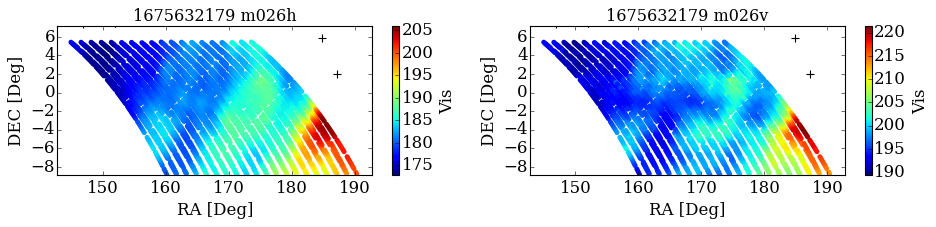

<Figure size 640x480 with 0 Axes>

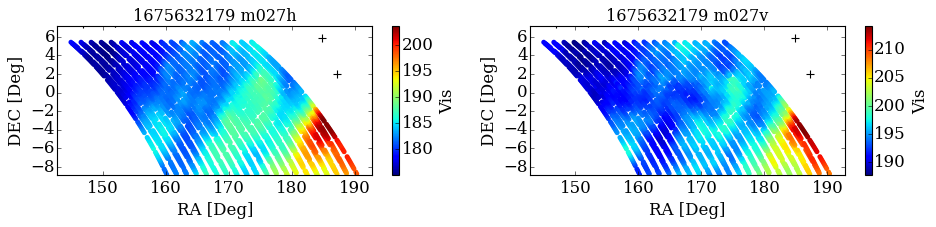

<Figure size 640x480 with 0 Axes>

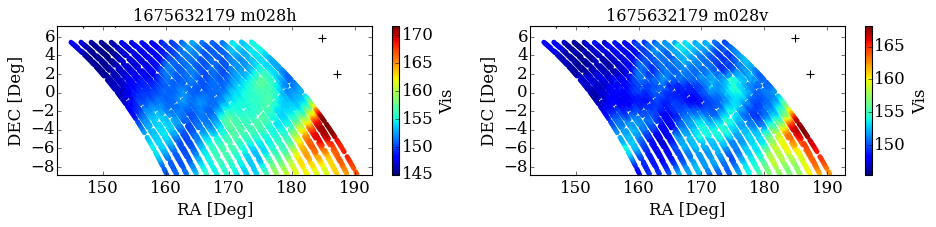

<Figure size 640x480 with 0 Axes>

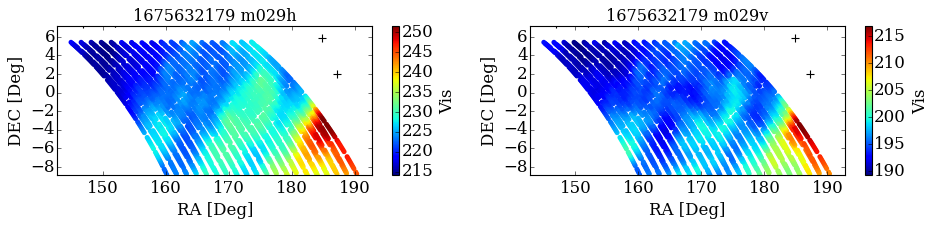

<Figure size 640x480 with 0 Axes>

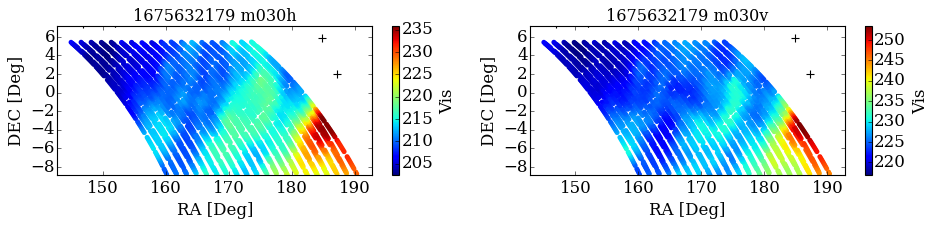

<Figure size 640x480 with 0 Axes>

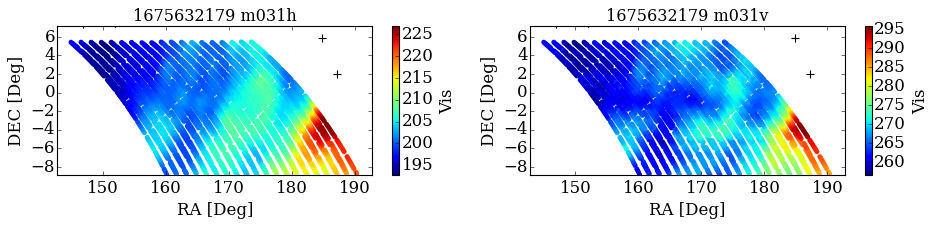

<Figure size 640x480 with 0 Axes>

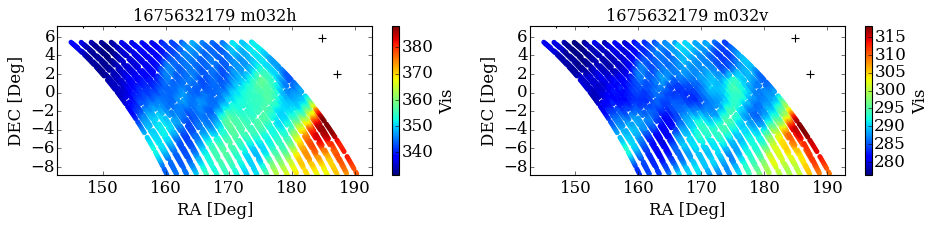

<Figure size 640x480 with 0 Axes>

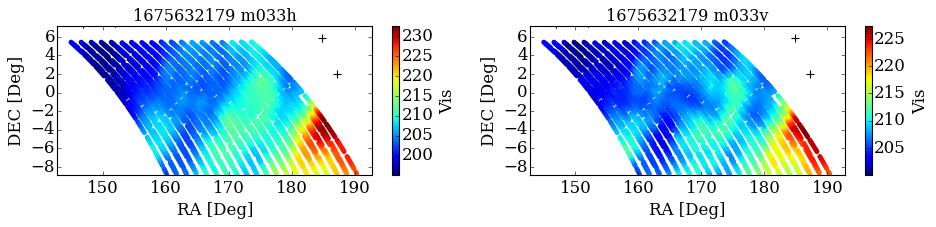

<Figure size 640x480 with 0 Axes>

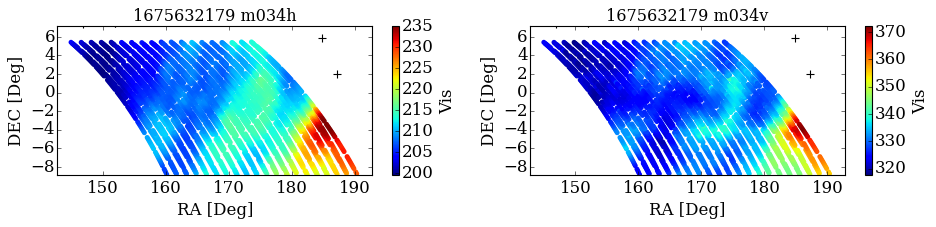

<Figure size 640x480 with 0 Axes>

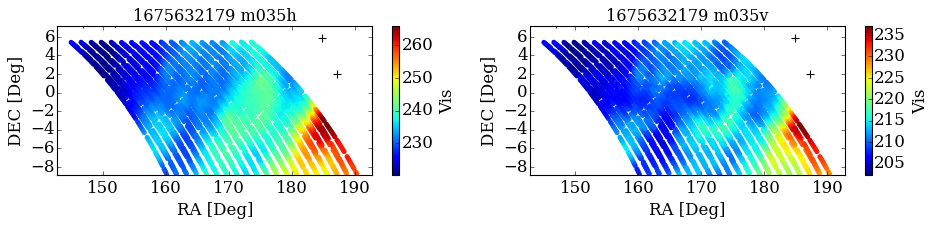

<Figure size 640x480 with 0 Axes>

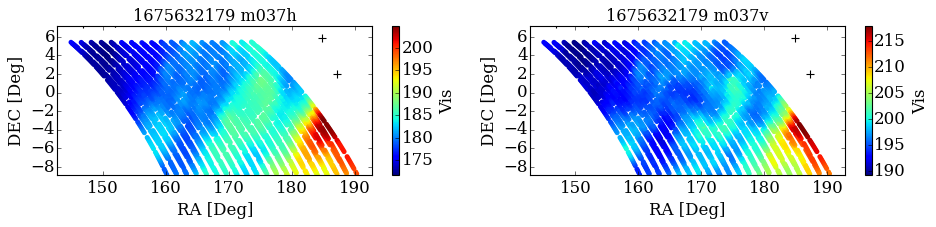

<Figure size 640x480 with 0 Axes>

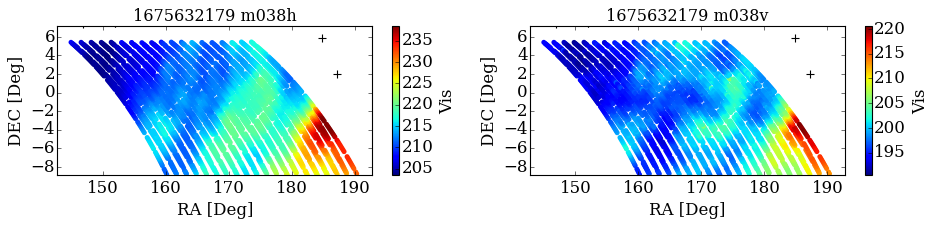

<Figure size 640x480 with 0 Axes>

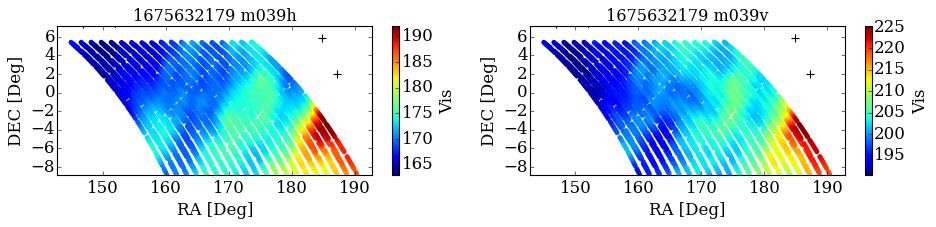

<Figure size 640x480 with 0 Axes>

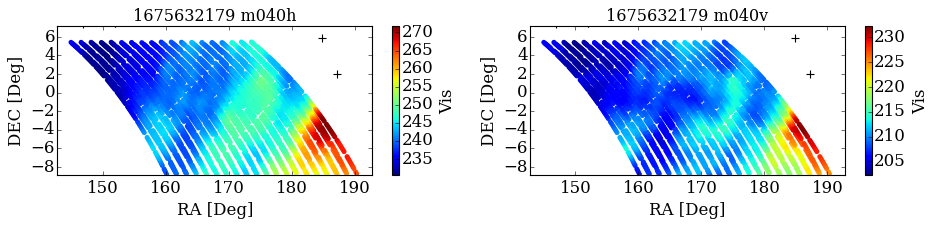

<Figure size 640x480 with 0 Axes>

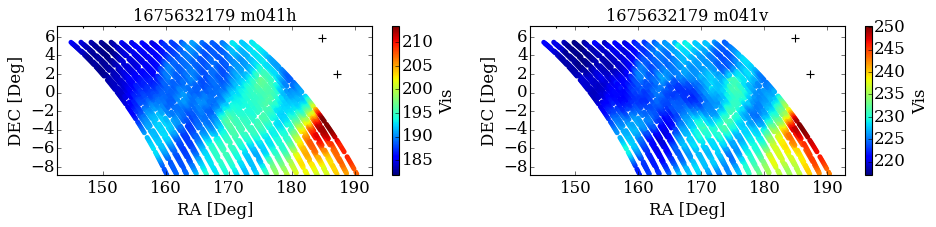

<Figure size 640x480 with 0 Axes>

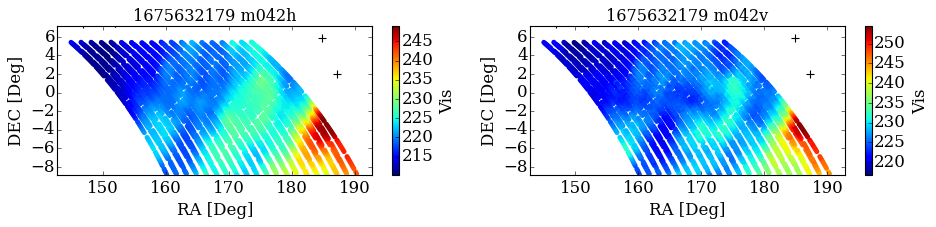

<Figure size 640x480 with 0 Axes>

In [ ]:
right_ascension_median = np.median(ra)
declination_median = np.median(dec)
point_source_file_path = (
    "/idia/projects/meerklass/MEERKLASS-1/uhf_data/OT2023/radio_source_catalog/"
)
point_sources_match_flux = (
    5.0  # flux threshold above which the point sources are selected, [Jy]
)
point_sources_match_raregion = 30.0  # the ra distance to the median of observed ra to select the point sources, [deg]
point_sources_match_decregion = 10.0  # the dec region to the median of observed dec to select the point sources [deg]
ra_point_source, dec_point_source, _ = tl.point_sources_coordinate(
    point_source_file_path,
    right_ascension_median,
    declination_median,
    point_sources_match_flux,
    point_sources_match_raregion,
    point_sources_match_decregion,
)


for i_antenna, ant in enumerate(antennas):
    fig = plt.figure(figsize=(12, 3))
    ax = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)

    i_receiver_list = [
        i for i, receiver in enumerate(receivers) if receiver.antenna_name == ant.name
    ]
    for i_receiver in i_receiver_list:
        if "h" in str(receiver_list[i_receiver]):
            sc_data = ax.scatter(
                ra[:, i_antenna],
                dec[:, i_antenna],
                c=vis_before_aoflagger_freqmedian[:, i_receiver],
                edgecolor="none",
                cmap="jet",
            )
            ax.scatter(
                ra_point_source, dec_point_source, color="black", marker="+", s=50
            )
            ax.set_title(block_name + " " + str(receiver_list[i_receiver]))
            cbar_data = plt.colorbar(sc_data)
            cbar_data.set_label("Vis", fontsize=15)
        elif "v" in str(receiver_list[i_receiver]):
            sc_data = ax2.scatter(
                ra[:, i_antenna],
                dec[:, i_antenna],
                c=vis_before_aoflagger_freqmedian[:, i_receiver],
                edgecolor="none",
                cmap="jet",
            )
            ax2.scatter(
                ra_point_source, dec_point_source, color="black", marker="+", s=50
            )
            ax2.set_title(block_name + " " + str(receiver_list[i_receiver]))
            cbar_data = plt.colorbar(sc_data)
            cbar_data.set_label("Vis", fontsize=15)

    ax.set_xlabel("RA [Deg]", fontsize=15)
    ax.set_ylabel("DEC [Deg]", fontsize=15)
    ax.set_xlim(np.median(ra) - 25, np.median(ra) + 25)
    ax.set_ylim(np.median(dec) - 8, np.median(dec) + 8)

    ax2.set_xlabel("RA [Deg]", fontsize=15)
    ax2.set_ylabel("DEC [Deg]", fontsize=15)
    ax2.set_xlim(np.median(ra) - 25, np.median(ra) + 25)
    ax2.set_ylim(np.median(dec) - 8, np.median(dec) + 8)

    plt.tight_layout()
    # plt.savefig(figure_path+block_name+'_'+str(ant.name)+'_waterfall_wenkai.png',dpi=200)
    plt.show()
    plt.clf()

## Scan Track Plot of Calibrated Data

The scan track plot of the calibrated data alongside the synchrotron model, 
used to assess data quality and compare with the model predictions.

<Figure size 640x480 with 0 Axes>

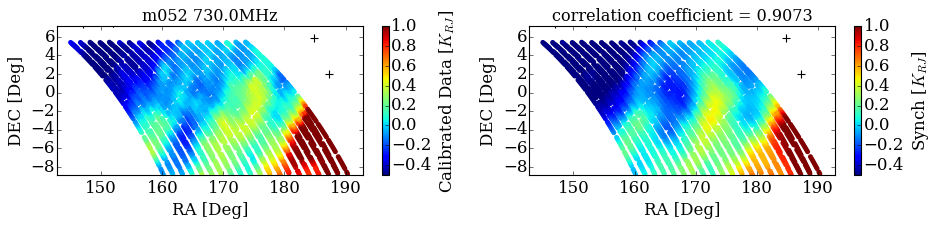

m053 is masked


<Figure size 640x480 with 0 Axes>

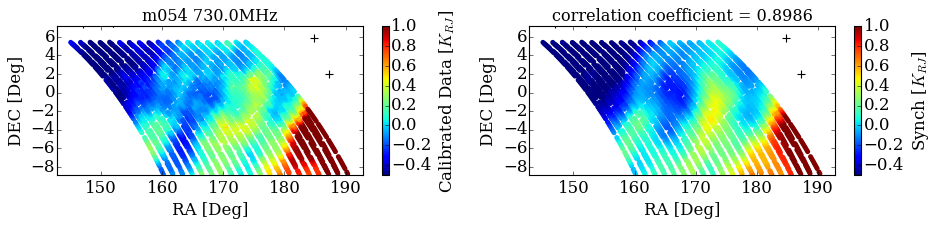

<Figure size 640x480 with 0 Axes>

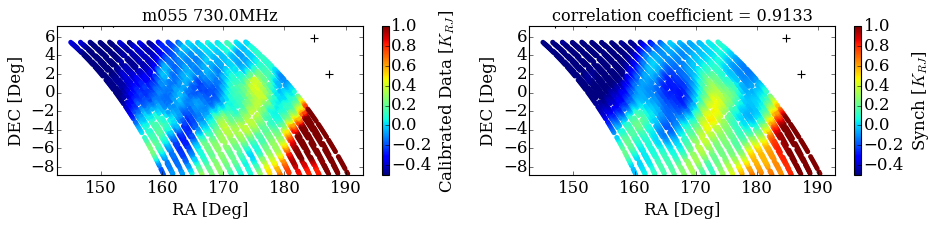

<Figure size 640x480 with 0 Axes>

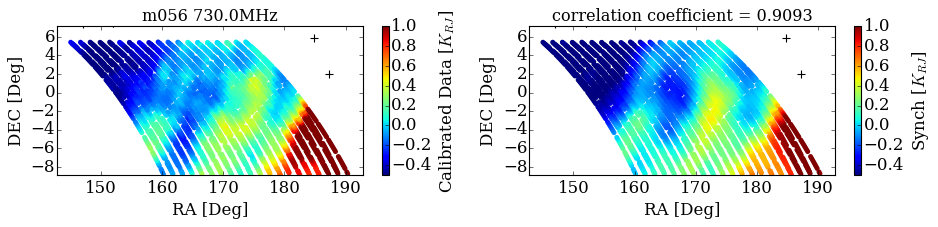

<Figure size 640x480 with 0 Axes>

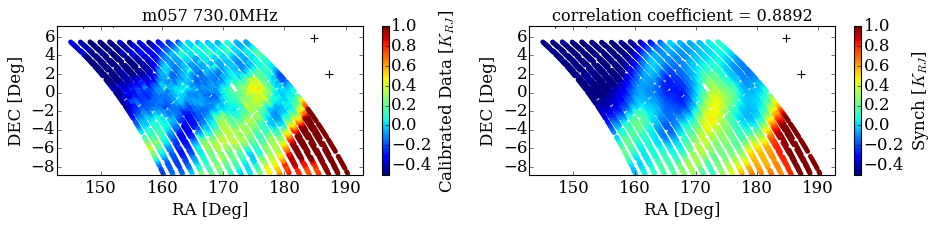

m058 is masked


<Figure size 640x480 with 0 Axes>

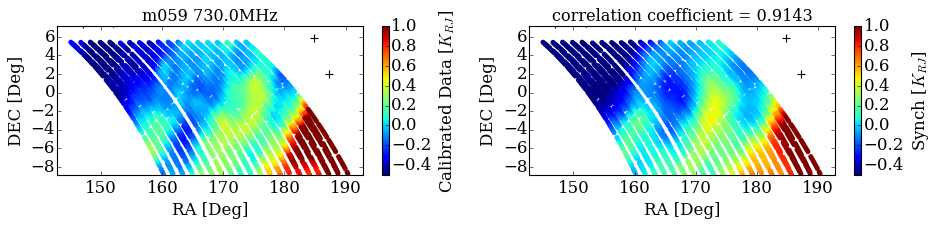

<Figure size 640x480 with 0 Axes>

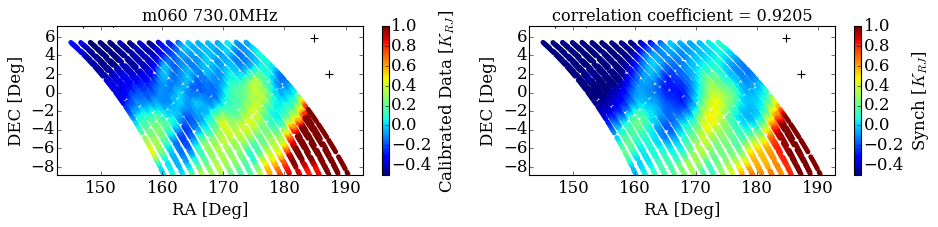

<Figure size 640x480 with 0 Axes>

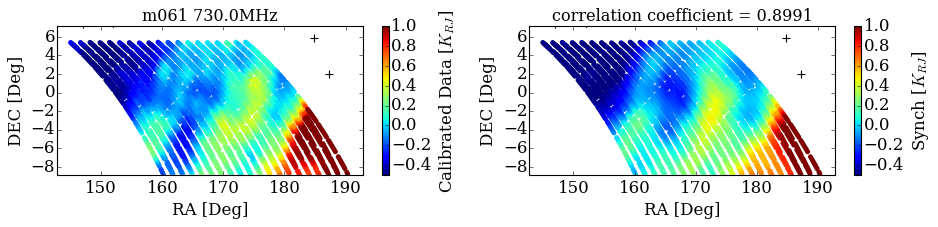

<Figure size 640x480 with 0 Axes>

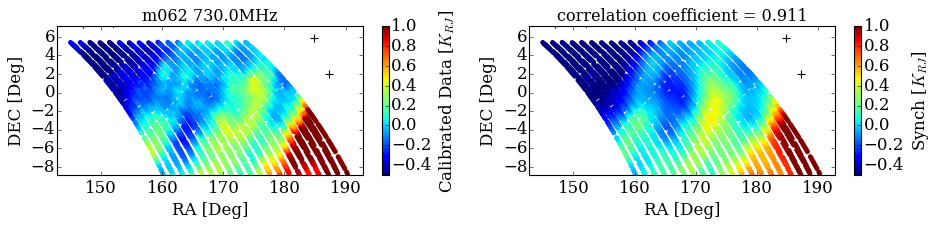

m063 is masked


<Figure size 640x480 with 0 Axes>

In [10]:
##########  compare with synch model (time median removed for both calibrated data and synch model ) ###########

right_ascension_median = np.median(ra)
declination_median = np.median(dec)
point_source_file_path = (
    "/idia/projects/meerklass/MEERKLASS-1/uhf_data/OT2023/radio_source_catalog/"
)
point_sources_match_flux = (
    5.0  # flux threshold above which the point sources are selected, [Jy]
)
point_sources_match_raregion = 30.0  # the ra distance to the median of observed ra to select the point sources, [deg]
point_sources_match_decregion = 10.0  # the dec region to the median of observed dec to select the point sources [deg]
ra_point_source, dec_point_source, _ = tl.point_sources_coordinate(
    point_source_file_path,
    right_ascension_median,
    declination_median,
    point_sources_match_flux,
    point_sources_match_raregion,
    point_sources_match_decregion,
)


nside = 128  # resolution parameter at which the synchrotron model is to be calculated
beamsize = 57.5  # the beam fwhm used to smooth the Synch model [arcmin]
beam_frequency = 1500.0  # reference frequency at which the beam fwhm are defined [MHz]
sky = pysm3.Sky(
    nside=nside, preset_strings=["s1"]
)  # Here we use "s1" vresion of synch model, please see https://pysm3.readthedocs.io/en/latest/models.html#synchrotron

calibrated_vis_freqmedian = np.ma.median(calibrated_vis, axis=1)
freq_plot = 730.0  #### MHz
freq_plot_up = 730.0 + 1.5  #### MHz
freq_plot_down = 730.0 - 1.5  #### MHz
freq_index_up = np.argmin(np.abs(freq - freq_plot_up))
freq_index_down = np.argmin(np.abs(freq - freq_plot_down))
calibrated_vis_freqplot = np.ma.median(
    calibrated_vis[:, freq_index_down:freq_index_up, :], axis=1
)

for i_antenna, antenna in enumerate(antenna_list):
    if calibrated_vis_freqmedian[:, i_antenna].mask.all():
        print(antenna + " is masked")
    else:
        # freq_mask = np.median(calibrated_vis.mask[:,:,i_antenna], axis=0)>0
        # freq_plot = np.ma.median(freq[~freq_mask])
        #########   produce synch model at a certain frequency and smooth   #########
        map_reference = sky.get_emission(freq_plot * u.MHz).value
        map_reference_smoothed = pysm3.apply_smoothing_and_coord_transform(
            map_reference,
            fwhm=beamsize
            * u.arcmin
            * ((beam_frequency * u.MHz) / (freq_plot * u.MHz)).decompose().value,
        )

        #########   map the smoothed synch model to the same sky covered by ra,dec of scan_data
        c = SkyCoord(
            ra=ra[:, i_antenna] * u.degree,
            dec=dec[:, i_antenna] * u.degree,
            frame="icrs",
        )
        theta = 90.0 - (c.galactic.b / u.degree).value
        phi = (c.galactic.l / u.degree).value
        synch_I = hp.pixelfunc.get_interp_val(
            map_reference_smoothed[0], theta / 180.0 * np.pi, phi / 180.0 * np.pi
        )
        synch_I = np.ma.masked_array(
            synch_I, mask=calibrated_vis_freqplot[:, i_antenna].mask
        )
        synch_I = synch_I / 10**6.0

        ########  plot  #########
        fig = plt.figure(figsize=(12, 3))
        ax = fig.add_subplot(1, 2, 1)
        ax2 = fig.add_subplot(1, 2, 2)

        calibrated_vis_nomedian = calibrated_vis_freqplot[:, i_antenna] - np.ma.median(
            calibrated_vis_freqplot[:, i_antenna]
        )
        sc_data = ax.scatter(
            ra[:, i_antenna],
            dec[:, i_antenna],
            c=calibrated_vis_nomedian,
            edgecolor="none",
            cmap="jet",
            vmin=-0.5,
            vmax=1.0,
        )
        ax.scatter(ra_point_source, dec_point_source, color="black", marker="+", s=50)
        ax.set_xlabel("RA [Deg]", fontsize=15)
        ax.set_ylabel("DEC [Deg]", fontsize=15)
        ax.set_title(antenna + " " + str(round(freq_plot, 3)) + "MHz")
        ax.set_xlim(np.median(ra) - 25, np.median(ra) + 25)
        ax.set_ylim(np.median(dec) - 8, np.median(dec) + 8)
        cbar_data = plt.colorbar(sc_data)
        cbar_data.set_label(r"Calibrated Data [$K_{RJ}$]", fontsize=15)

        synch_I_nomedian = synch_I - np.ma.median(synch_I)
        spearman_corr, spearman_p = spearmanr(
            calibrated_vis_nomedian.data[~calibrated_vis_nomedian.mask],
            synch_I_nomedian.data[~calibrated_vis_nomedian.mask],
        )
        sc_data = ax2.scatter(
            ra[:, i_antenna],
            dec[:, i_antenna],
            c=synch_I_nomedian,
            edgecolor="none",
            cmap="jet",
            vmin=-0.5,
            vmax=1.0,
        )
        ax2.scatter(ra_point_source, dec_point_source, color="black", marker="+", s=50)
        ax2.set_xlabel("RA [Deg]", fontsize=15)
        ax2.set_ylabel("DEC [Deg]", fontsize=15)
        ax2.set_title("correlation coefficient = " + str(round(spearman_corr, 4)))
        ax2.set_xlim(np.median(ra) - 25, np.median(ra) + 25)
        ax2.set_ylim(np.median(dec) - 8, np.median(dec) + 8)
        cbar_data = plt.colorbar(sc_data)
        cbar_data.set_label(r"Synch [$K_{RJ}$]", fontsize=15)

        plt.tight_layout()
        # plt.savefig(figure_path+block_name+'_'+antenna+'_'+str(freq_plot) +'MHz.png',dpi=200)
        plt.show()
        plt.clf()